In [1]:
# import the libraries

import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
# visualization function

def  show(tensor, ch=1, size=(28,28), num=16):

  #tensor: 128 x 784
  data=tensor.detach().cpu().view(-1,ch,*size)
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)
  plt.imshow(grid)
  plt.show()

In [3]:
# setup of the main parameters and hyperparameter
epochs = 100
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()), shuffle=True, batch_size=bs)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [4]:
from torch.nn.modules.batchnorm import BatchNorm1d
# declare our models

#Generator
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim),
        genBlock(h_dim, h_dim*2),
        genBlock(h_dim*2, h_dim*4),
        genBlock(h_dim*4, h_dim*8),
        nn.Linear(h_dim*8, i_dim),
        nn.Sigmoid(),
    )

  def forward(self, noise):
      return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)


  # Discriminator
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc=nn.Sequential(
        discBlock(i_dim, h_dim*4),
        discBlock(h_dim*4, h_dim*2),
        discBlock(h_dim*2, h_dim),
        nn.Linear(h_dim, 1)
    )

  def forward(self, image):
      return self.disc(image)

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([2, 2, 0, 1, 1, 9, 2, 9, 8, 7])


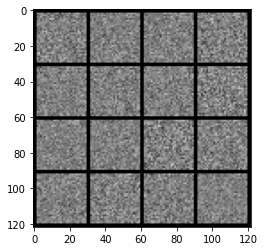

In [6]:
x,y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [7]:
# Calculating the loss

# Generator loss

def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  pred = disc(fake)
  targets = torch.ones_like(pred)
  gen_loss = loss_func(pred, targets)

  return gen_loss

def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)

  disc_fake = disc(fake.detach())
  disc_fake_targets = torch.zeros_like(disc_fake)
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)

  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss = (disc_fake_loss + disc_real_loss)/2

  return disc_loss

 64%|██████▍   | 300/469 [00:06<00:04, 37.53it/s]

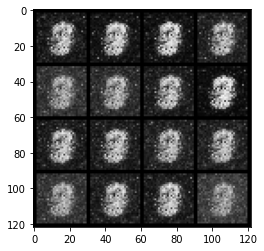

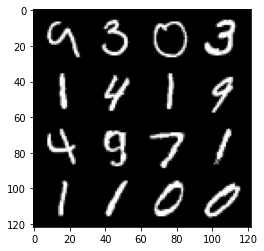

 66%|██████▌   | 308/469 [00:06<00:07, 21.95it/s]

0: step 300 / Gen loss: 1.9054563870032617 / disc_loss: 0.33575482765833553


 27%|██▋       | 126/469 [00:02<00:06, 52.49it/s]

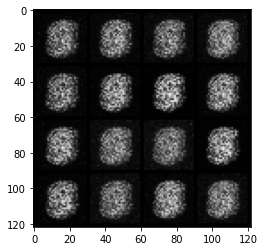

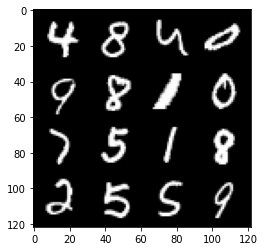

 29%|██▉       | 137/469 [00:02<00:09, 34.19it/s]

1: step 600 / Gen loss: 3.4807368739446014 / disc_loss: 0.11202760331332673


 92%|█████████▏| 430/469 [00:08<00:00, 52.14it/s]

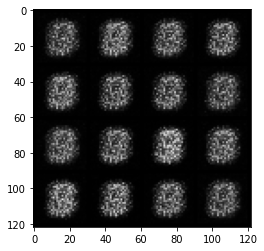

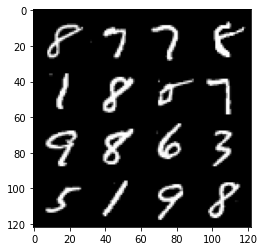

 93%|█████████▎| 436/469 [00:08<00:01, 29.47it/s]

1: step 900 / Gen loss: 3.386673190593721 / disc_loss: 0.05796499679485953


 55%|█████▌    | 259/469 [00:05<00:04, 50.97it/s]

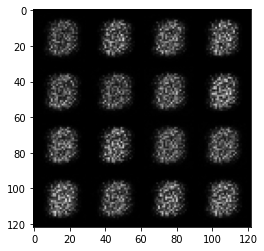

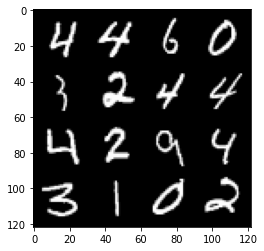

 58%|█████▊    | 271/469 [00:06<00:05, 35.60it/s]

2: step 1200 / Gen loss: 3.3780890274047812 / disc_loss: 0.04071586704502497


 19%|█▉        | 90/469 [00:01<00:07, 51.85it/s]

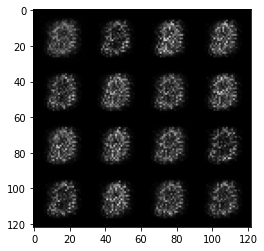

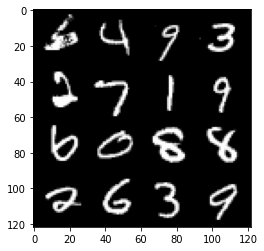

 22%|██▏       | 102/469 [00:02<00:10, 35.70it/s]

3: step 1500 / Gen loss: 3.482788962523143 / disc_loss: 0.03675476387143137


 83%|████████▎ | 388/469 [00:07<00:01, 51.78it/s]

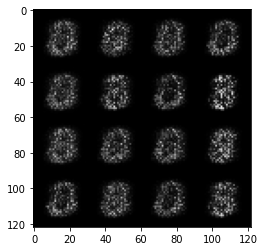

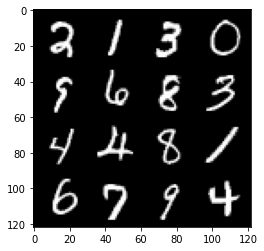

 85%|████████▌ | 399/469 [00:08<00:02, 34.60it/s]

3: step 1800 / Gen loss: 3.5130412284533183 / disc_loss: 0.03976509025941293


 47%|████▋     | 220/469 [00:04<00:05, 49.33it/s]

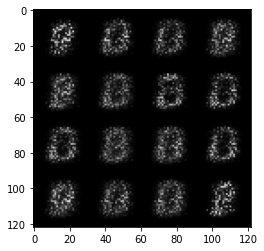

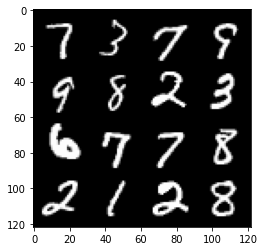

 49%|████▉     | 229/469 [00:04<00:07, 31.11it/s]

4: step 2100 / Gen loss: 3.868808274269105 / disc_loss: 0.03413248971725507


 11%|█         | 52/469 [00:01<00:08, 50.51it/s]

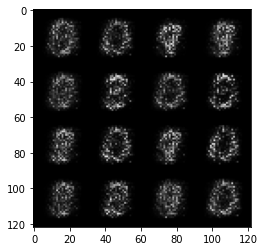

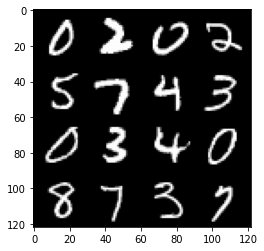

 14%|█▎        | 64/469 [00:01<00:11, 34.71it/s]

5: step 2400 / Gen loss: 4.2637252044677725 / disc_loss: 0.031979319664339215


 75%|███████▌  | 352/469 [00:07<00:02, 49.49it/s]

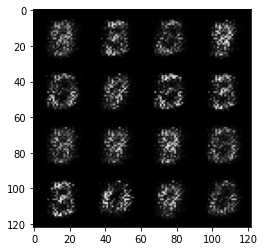

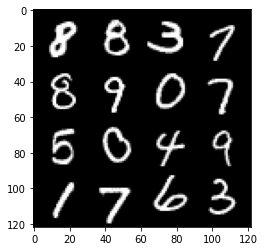

 77%|███████▋  | 362/469 [00:07<00:03, 31.89it/s]

5: step 2700 / Gen loss: 4.583822763760885 / disc_loss: 0.024066507415845997


 40%|███▉      | 186/469 [00:03<00:05, 49.89it/s]

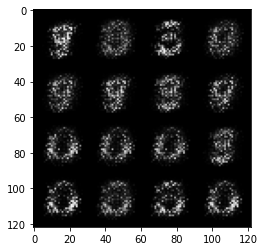

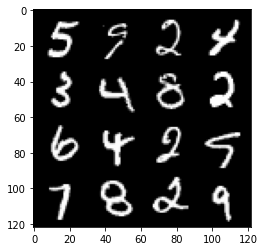

 41%|████      | 191/469 [00:04<00:10, 26.36it/s]

6: step 3000 / Gen loss: 4.717837214469911 / disc_loss: 0.02094896601823469


  3%|▎         | 14/469 [00:00<00:10, 42.97it/s]

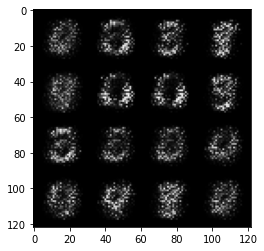

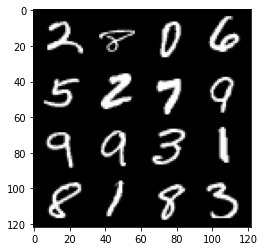

  5%|▌         | 24/469 [00:00<00:16, 27.29it/s]

7: step 3300 / Gen loss: 5.303582668304447 / disc_loss: 0.014521353133022778


 67%|██████▋   | 315/469 [00:06<00:03, 49.78it/s]

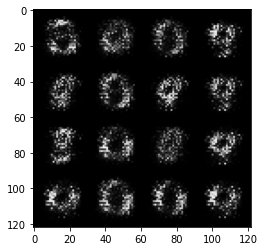

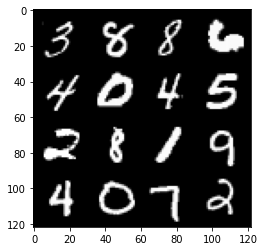

 69%|██████▉   | 325/469 [00:07<00:04, 33.69it/s]

7: step 3600 / Gen loss: 5.772420976956685 / disc_loss: 0.014894940080121155


 31%|███       | 144/469 [00:02<00:06, 51.09it/s]

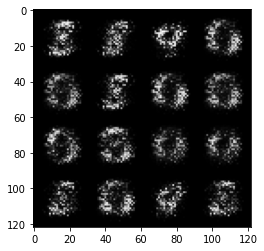

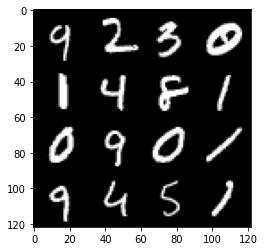

 33%|███▎      | 156/469 [00:03<00:08, 35.62it/s]

8: step 3900 / Gen loss: 5.863078209559124 / disc_loss: 0.013817421641821665


 95%|█████████▍| 445/469 [00:09<00:00, 48.81it/s]

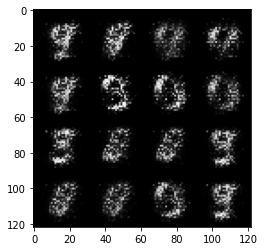

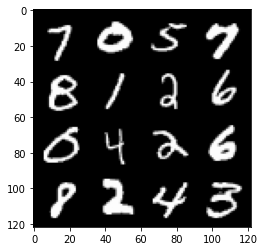

 97%|█████████▋| 455/469 [00:10<00:00, 32.97it/s]

8: step 4200 / Gen loss: 5.938709238370261 / disc_loss: 0.01523529260884971


 59%|█████▉    | 279/469 [00:05<00:03, 48.20it/s]

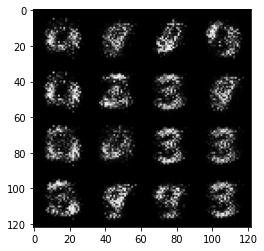

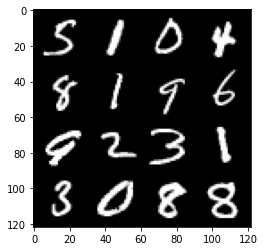

 62%|██████▏   | 290/469 [00:06<00:05, 33.87it/s]

9: step 4500 / Gen loss: 5.943181858062746 / disc_loss: 0.014536640867590909


 23%|██▎       | 106/469 [00:02<00:07, 50.99it/s]

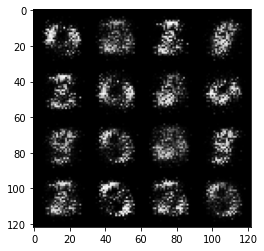

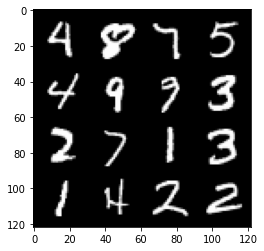

 25%|██▌       | 118/469 [00:02<00:10, 34.49it/s]

10: step 4800 / Gen loss: 5.80631651083628 / disc_loss: 0.013631956251338118


 87%|████████▋ | 406/469 [00:08<00:01, 47.35it/s]

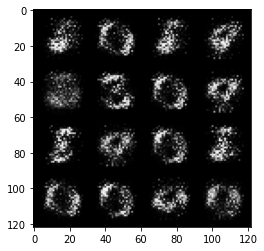

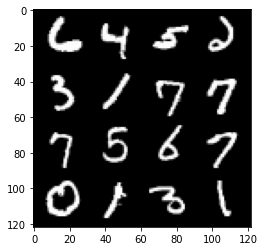

 89%|████████▊ | 416/469 [00:09<00:01, 32.02it/s]

10: step 5100 / Gen loss: 6.2822530190149966 / disc_loss: 0.0110836957821933


 51%|█████     | 239/469 [00:04<00:04, 49.17it/s]

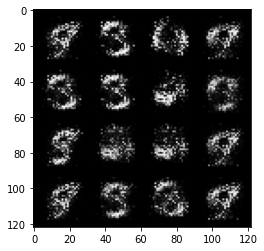

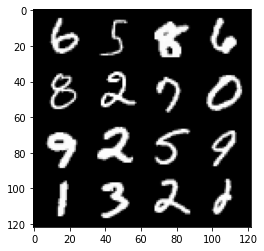

 53%|█████▎    | 249/469 [00:05<00:06, 32.81it/s]

11: step 5400 / Gen loss: 6.670890007019043 / disc_loss: 0.008579160075945157


 15%|█▍        | 69/469 [00:01<00:08, 49.26it/s]

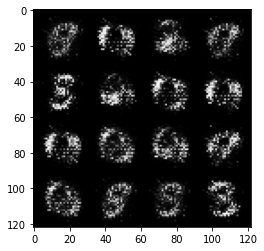

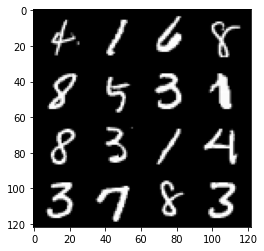

 17%|█▋        | 79/469 [00:01<00:13, 28.82it/s]

12: step 5700 / Gen loss: 6.8092075077692655 / disc_loss: 0.007739979053537059


 79%|███████▊  | 369/469 [00:08<00:02, 39.02it/s]

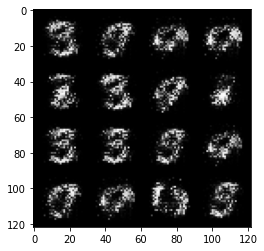

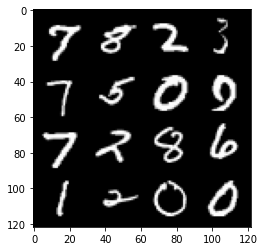

 81%|████████  | 378/469 [00:09<00:03, 27.81it/s]

12: step 6000 / Gen loss: 7.058886044820153 / disc_loss: 0.008630810549172264


 43%|████▎     | 200/469 [00:04<00:05, 47.30it/s]

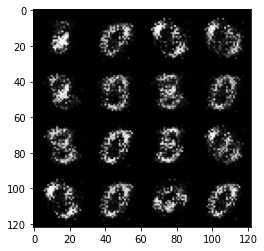

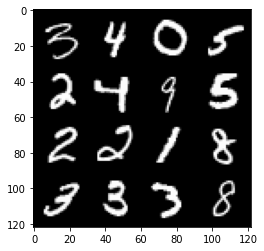

 45%|████▍     | 210/469 [00:04<00:08, 31.03it/s]

13: step 6300 / Gen loss: 6.8665137656529724 / disc_loss: 0.011332419579848643


  6%|▋         | 30/469 [00:00<00:09, 44.61it/s]

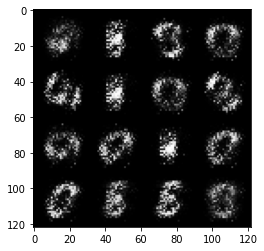

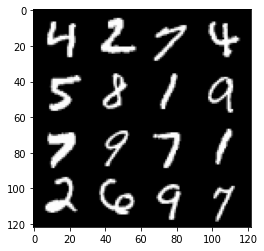

  9%|▊         | 40/469 [00:01<00:14, 29.39it/s]

14: step 6600 / Gen loss: 7.109601895014448 / disc_loss: 0.010453314632953462


 70%|███████   | 329/469 [00:07<00:02, 47.61it/s]

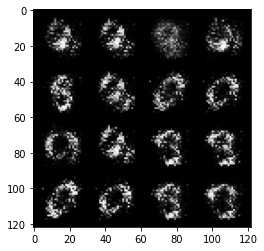

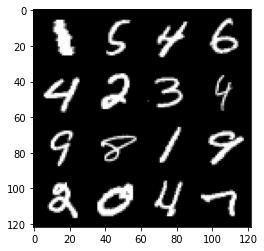

 72%|███████▏  | 340/469 [00:07<00:03, 33.03it/s]

14: step 6900 / Gen loss: 6.98540791034699 / disc_loss: 0.009791495223374417


 35%|███▍      | 163/469 [00:03<00:06, 47.94it/s]

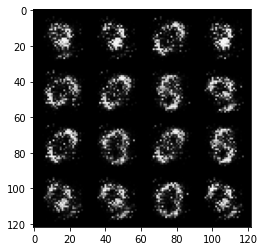

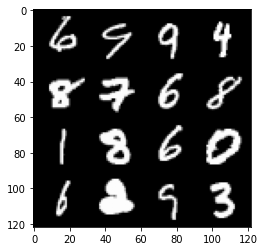

 37%|███▋      | 173/469 [00:03<00:09, 31.55it/s]

15: step 7200 / Gen loss: 7.049122713406879 / disc_loss: 0.00864999792305753


 98%|█████████▊| 461/469 [00:10<00:00, 47.75it/s]

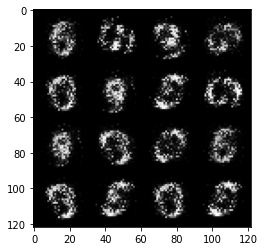

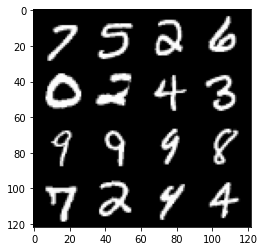

100%|██████████| 469/469 [00:10<00:00, 44.75it/s]


15: step 7500 / Gen loss: 7.066349409421286 / disc_loss: 0.00875696877677304


 63%|██████▎   | 294/469 [00:06<00:05, 33.47it/s]

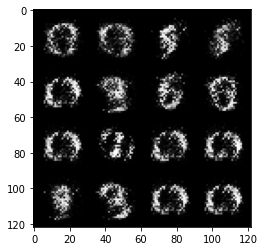

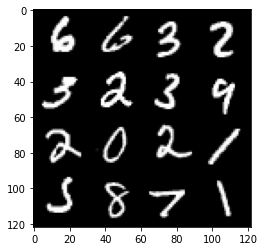

 65%|██████▍   | 303/469 [00:07<00:06, 24.07it/s]

16: step 7800 / Gen loss: 7.434660031000774 / disc_loss: 0.008489137053256855


 27%|██▋       | 125/469 [00:02<00:07, 47.07it/s]

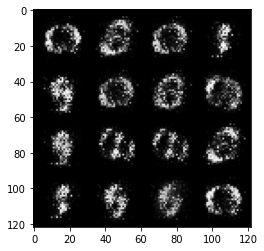

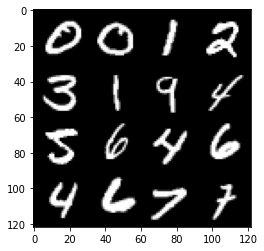

 29%|██▉       | 135/469 [00:03<00:10, 30.84it/s]

17: step 8100 / Gen loss: 7.534701921145121 / disc_loss: 0.0092421971517615


 91%|█████████ | 425/469 [00:09<00:00, 46.81it/s]

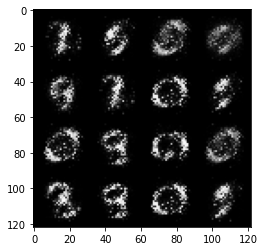

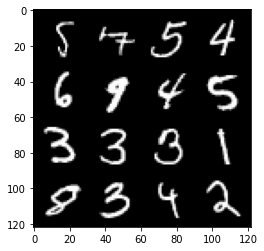

 93%|█████████▎| 435/469 [00:09<00:01, 27.73it/s]

17: step 8400 / Gen loss: 7.835980982780449 / disc_loss: 0.01023202519786234


 54%|█████▍    | 254/469 [00:05<00:04, 47.46it/s]

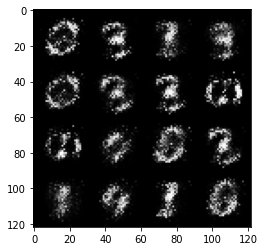

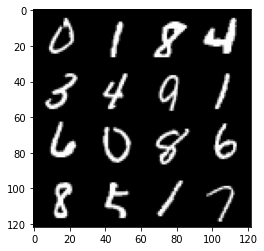

 56%|█████▋    | 264/469 [00:05<00:06, 31.49it/s]

18: step 8700 / Gen loss: 7.439394129117325 / disc_loss: 0.011180205683534351


 19%|█▉        | 89/469 [00:01<00:08, 46.61it/s]

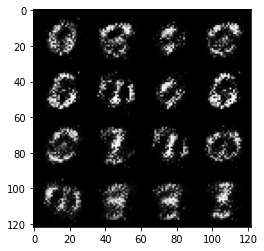

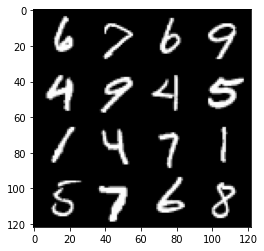

 21%|██        | 99/469 [00:02<00:11, 30.99it/s]

19: step 9000 / Gen loss: 6.980112331708274 / disc_loss: 0.012035216234701992


 83%|████████▎ | 389/469 [00:08<00:01, 46.64it/s]

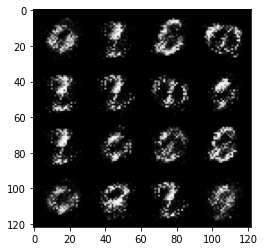

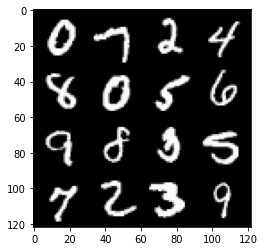

 84%|████████▍ | 394/469 [00:09<00:02, 26.41it/s]

19: step 9300 / Gen loss: 7.091218290328981 / disc_loss: 0.012378662183958427


 46%|████▌     | 216/469 [00:05<00:06, 38.87it/s]

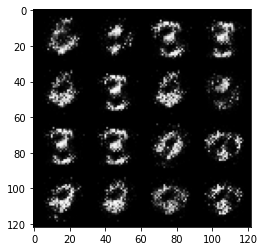

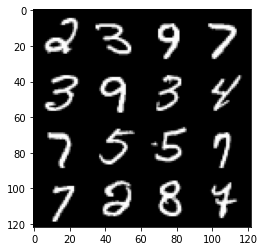

 48%|████▊     | 225/469 [00:05<00:09, 26.67it/s]

20: step 9600 / Gen loss: 7.799943950970968 / disc_loss: 0.011168119426195815


 11%|█         | 51/469 [00:01<00:12, 34.03it/s]

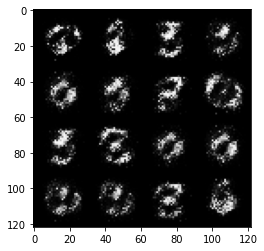

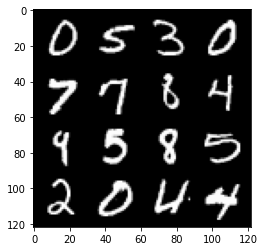

 13%|█▎        | 59/469 [00:02<00:18, 21.59it/s]

21: step 9900 / Gen loss: 7.639719168345131 / disc_loss: 0.013178482278405372


 75%|███████▍  | 351/469 [00:08<00:02, 46.33it/s]

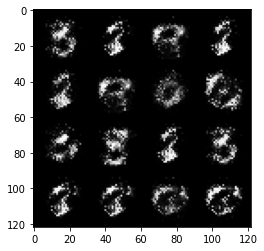

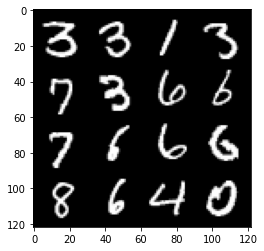

 77%|███████▋  | 361/469 [00:09<00:03, 30.62it/s]

21: step 10200 / Gen loss: 7.155830405553181 / disc_loss: 0.012496962576018027


 38%|███▊      | 179/469 [00:03<00:06, 47.23it/s]

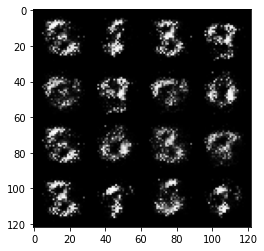

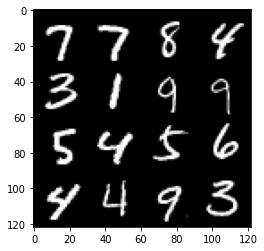

 40%|████      | 189/469 [00:04<00:09, 29.45it/s]

22: step 10500 / Gen loss: 7.435801107088721 / disc_loss: 0.01055535811232403


  2%|▏         | 9/469 [00:00<00:10, 42.39it/s]

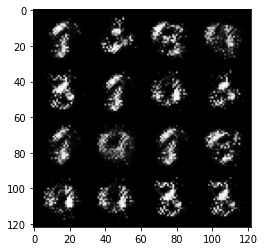

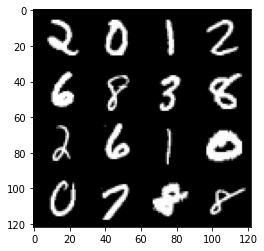

  4%|▍         | 18/469 [00:00<00:17, 25.54it/s]

23: step 10800 / Gen loss: 7.73121827920278 / disc_loss: 0.008268283035528535


 66%|██████▋   | 311/469 [00:07<00:03, 45.49it/s]

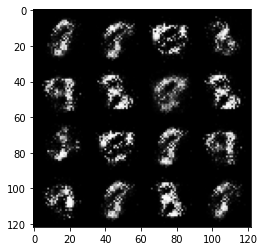

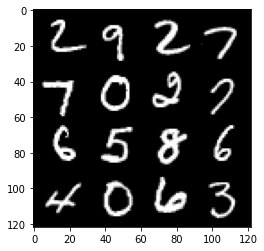

 68%|██████▊   | 321/469 [00:07<00:05, 26.95it/s]

23: step 11100 / Gen loss: 8.060426379839578 / disc_loss: 0.008214621395648767


 30%|███       | 143/469 [00:03<00:07, 44.70it/s]

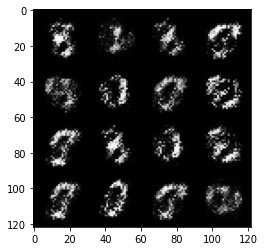

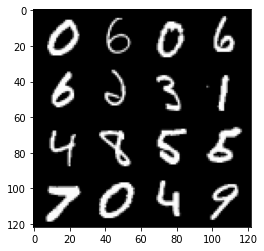

 33%|███▎      | 153/469 [00:04<00:10, 30.76it/s]

24: step 11400 / Gen loss: 7.6584751780827895 / disc_loss: 0.01037066819340302


 94%|█████████▍| 442/469 [00:10<00:00, 46.50it/s]

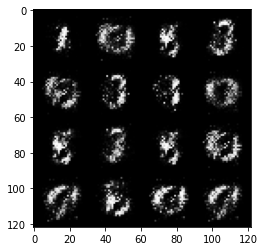

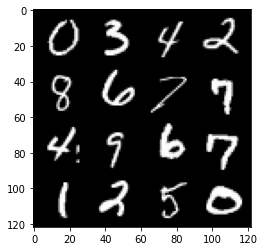

 96%|█████████▋| 452/469 [00:11<00:00, 30.36it/s]

24: step 11700 / Gen loss: 7.642865018844605 / disc_loss: 0.010167835320268449


 58%|█████▊    | 274/469 [00:05<00:04, 46.62it/s]

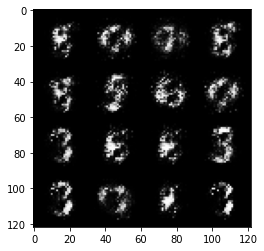

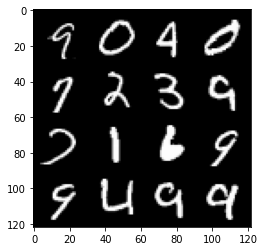

 61%|██████    | 284/469 [00:06<00:06, 30.36it/s]

25: step 12000 / Gen loss: 7.949979572296143 / disc_loss: 0.012428570562042296


 22%|██▏       | 103/469 [00:02<00:08, 44.74it/s]

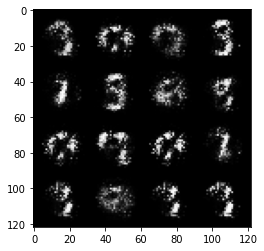

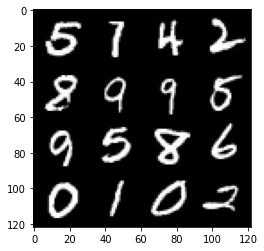

 24%|██▍       | 113/469 [00:02<00:11, 30.60it/s]

26: step 12300 / Gen loss: 7.517392977078756 / disc_loss: 0.014886758058176684


 86%|████████▌ | 402/469 [00:09<00:01, 43.94it/s]

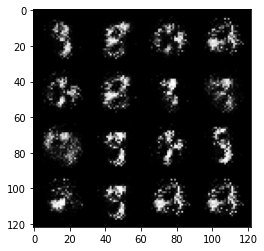

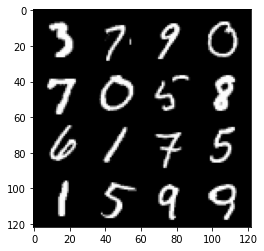

 88%|████████▊ | 411/469 [00:09<00:02, 25.07it/s]

26: step 12600 / Gen loss: 7.251075013478598 / disc_loss: 0.01421844273029516


 51%|█████     | 237/469 [00:05<00:05, 45.49it/s]

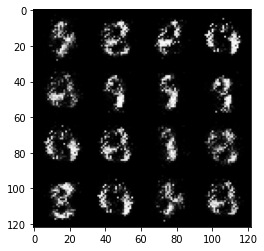

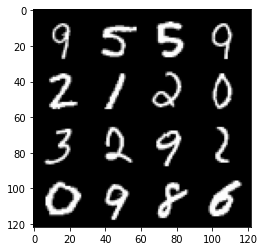

 52%|█████▏    | 242/469 [00:05<00:08, 26.26it/s]

27: step 12900 / Gen loss: 7.5715041255950934 / disc_loss: 0.013398724265086148


 14%|█▍        | 67/469 [00:01<00:09, 43.74it/s]

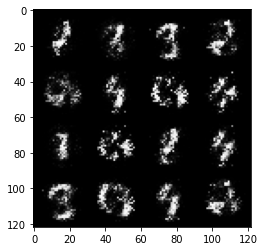

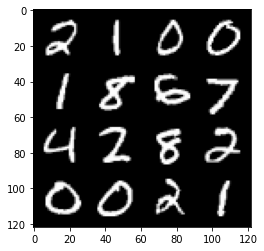

 16%|█▋        | 77/469 [00:02<00:13, 28.36it/s]

28: step 13200 / Gen loss: 7.020537341435755 / disc_loss: 0.015319694984549036


 78%|███████▊  | 366/469 [00:08<00:02, 45.31it/s]

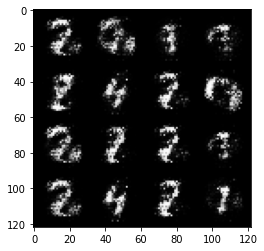

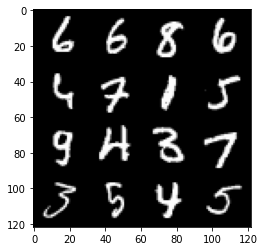

 80%|████████  | 376/469 [00:09<00:03, 30.53it/s]

28: step 13500 / Gen loss: 7.4089970938364695 / disc_loss: 0.015043321438909818


 42%|████▏     | 196/469 [00:04<00:06, 44.88it/s]

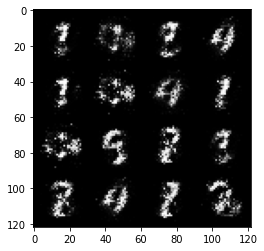

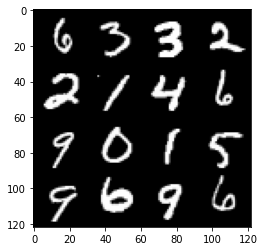

 44%|████▍     | 206/469 [00:04<00:09, 26.93it/s]

29: step 13800 / Gen loss: 7.208907985687259 / disc_loss: 0.01300440900803854


  6%|▌         | 29/469 [00:00<00:10, 42.06it/s]

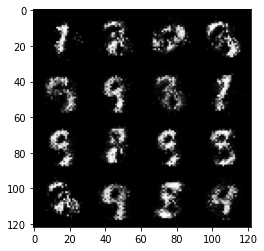

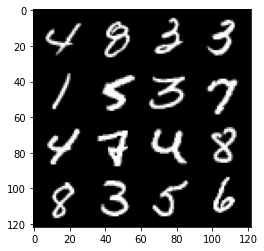

  8%|▊         | 39/469 [00:01<00:14, 28.83it/s]

30: step 14100 / Gen loss: 7.316624722480772 / disc_loss: 0.014320132579499233


 70%|██████▉   | 328/469 [00:07<00:03, 45.13it/s]

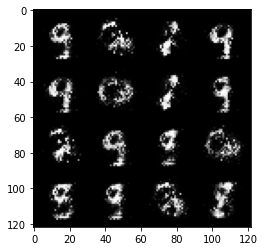

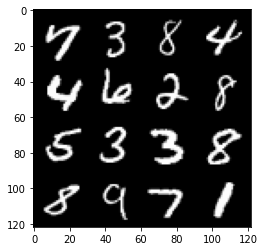

 72%|███████▏  | 338/469 [00:08<00:04, 29.66it/s]

30: step 14400 / Gen loss: 7.121677920023598 / disc_loss: 0.01647353185806424


 34%|███▎      | 158/469 [00:04<00:10, 30.28it/s]

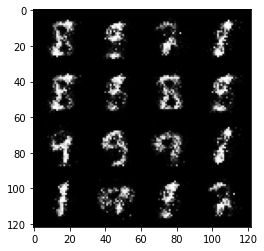

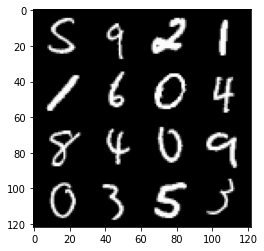

 35%|███▌      | 165/469 [00:04<00:16, 18.75it/s]

31: step 14700 / Gen loss: 7.059963862101233 / disc_loss: 0.01471691740987201


 98%|█████████▊| 460/469 [00:11<00:00, 44.79it/s]

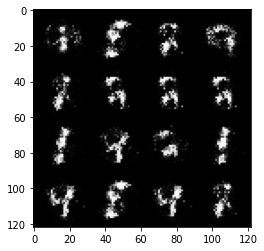

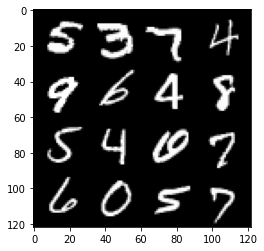

100%|██████████| 469/469 [00:12<00:00, 39.06it/s]


31: step 15000 / Gen loss: 7.152053306897483 / disc_loss: 0.01392050188539239


 62%|██████▏   | 290/469 [00:06<00:04, 42.94it/s]

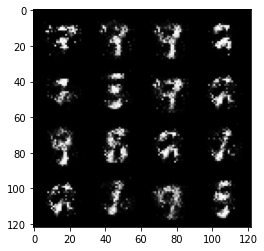

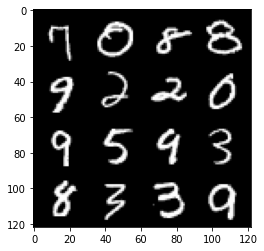

 64%|██████▍   | 299/469 [00:07<00:05, 28.53it/s]

32: step 15300 / Gen loss: 6.713540344238283 / disc_loss: 0.018555181766860173


 26%|██▌       | 122/469 [00:02<00:07, 43.72it/s]

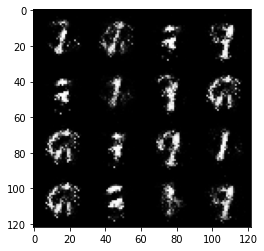

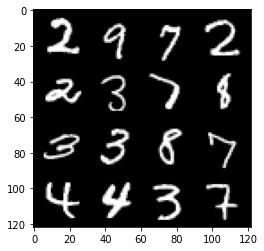

 28%|██▊       | 131/469 [00:03<00:12, 27.85it/s]

33: step 15600 / Gen loss: 6.765806597073869 / disc_loss: 0.0171189595432952


 90%|████████▉ | 420/469 [00:09<00:01, 45.14it/s]

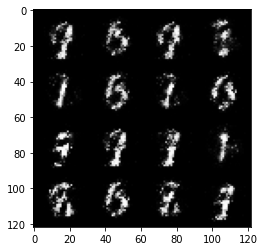

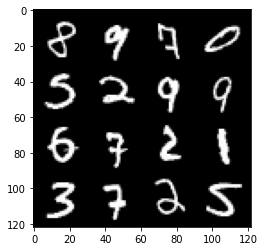

 91%|█████████▏| 429/469 [00:10<00:01, 28.26it/s]

33: step 15900 / Gen loss: 6.916683324178057 / disc_loss: 0.017107291779636092


 54%|█████▎    | 251/469 [00:05<00:04, 44.04it/s]

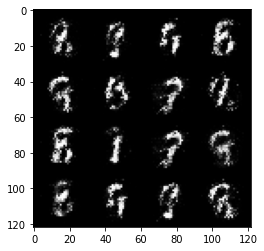

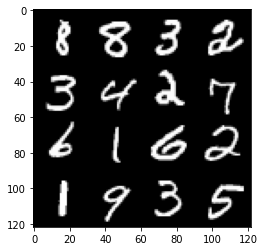

 55%|█████▌    | 260/469 [00:06<00:07, 27.70it/s]

34: step 16200 / Gen loss: 7.008028151194256 / disc_loss: 0.01859559296785544


 17%|█▋        | 82/469 [00:01<00:09, 42.93it/s]

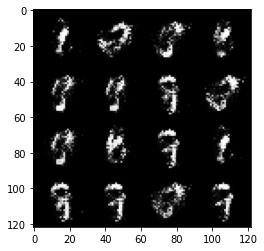

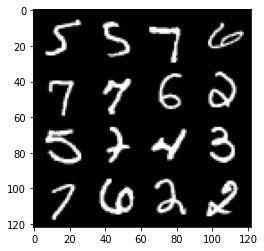

 19%|█▉        | 91/469 [00:02<00:14, 25.36it/s]

35: step 16500 / Gen loss: 6.979993001619979 / disc_loss: 0.019048335523499795


 82%|████████▏ | 384/469 [00:09<00:01, 43.28it/s]

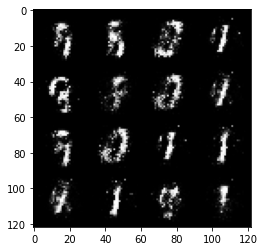

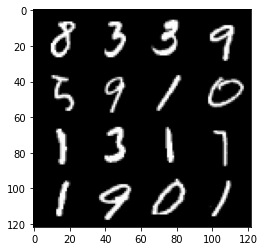

 84%|████████▍ | 393/469 [00:09<00:02, 28.09it/s]

35: step 16800 / Gen loss: 7.431754213968918 / disc_loss: 0.01867397213509928


 45%|████▌     | 212/469 [00:04<00:05, 45.08it/s]

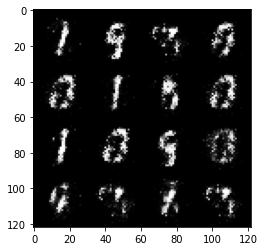

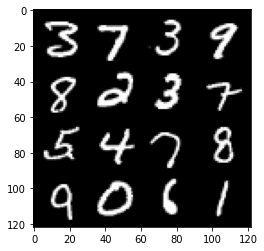

 47%|████▋     | 221/469 [00:05<00:08, 28.09it/s]

36: step 17100 / Gen loss: 7.026703098615012 / disc_loss: 0.019153040132950987


 10%|▉         | 46/469 [00:01<00:10, 41.31it/s]

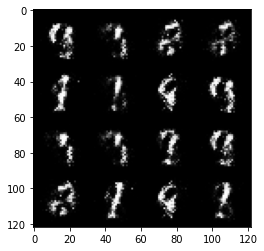

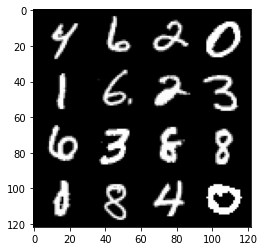

 12%|█▏        | 55/469 [00:01<00:15, 26.48it/s]

37: step 17400 / Gen loss: 6.972853787740073 / disc_loss: 0.028324897040923454


 74%|███████▍  | 347/469 [00:08<00:03, 38.08it/s]

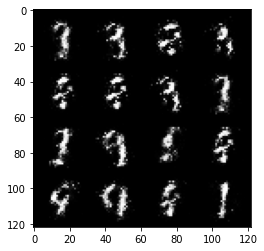

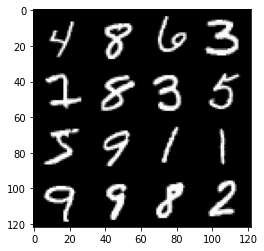

 76%|███████▌  | 355/469 [00:09<00:04, 23.03it/s]

37: step 17700 / Gen loss: 6.3039233605066896 / disc_loss: 0.030212814109399917


 38%|███▊      | 177/469 [00:04<00:06, 43.30it/s]

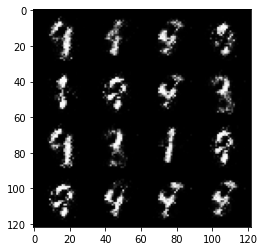

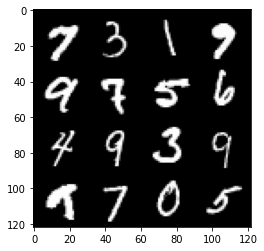

 40%|███▉      | 187/469 [00:04<00:09, 29.06it/s]

38: step 18000 / Gen loss: 6.609671931266787 / disc_loss: 0.029731576188156993


  2%|▏         | 8/469 [00:00<00:15, 29.69it/s]

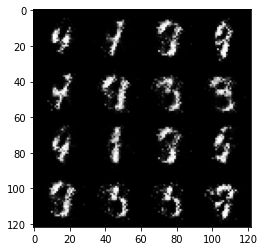

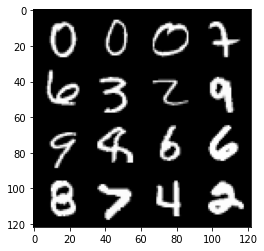

  3%|▎         | 14/469 [00:01<00:35, 12.67it/s]

39: step 18300 / Gen loss: 6.605909663836166 / disc_loss: 0.027620370167617994


 65%|██████▌   | 306/469 [00:09<00:03, 43.46it/s]

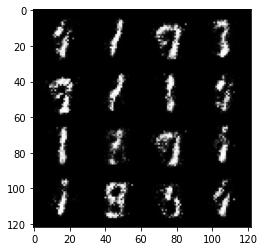

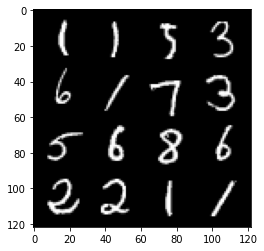

 67%|██████▋   | 315/469 [00:09<00:05, 28.09it/s]

39: step 18600 / Gen loss: 6.672846423784886 / disc_loss: 0.029577840588365996


 29%|██▉       | 138/469 [00:03<00:07, 42.39it/s]

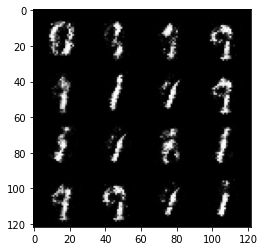

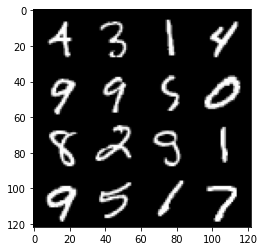

 31%|███▏      | 147/469 [00:03<00:11, 26.86it/s]

40: step 18900 / Gen loss: 6.075972375869752 / disc_loss: 0.03385209930750232


 93%|█████████▎| 438/469 [00:10<00:00, 40.81it/s]

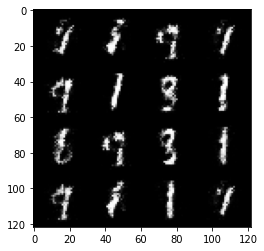

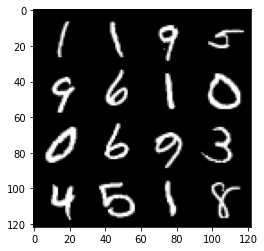

 95%|█████████▌| 447/469 [00:11<00:00, 24.45it/s]

40: step 19200 / Gen loss: 5.759811905225118 / disc_loss: 0.03529459081590175


 58%|█████▊    | 271/469 [00:07<00:05, 36.44it/s]

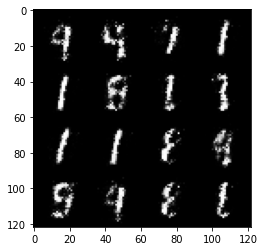

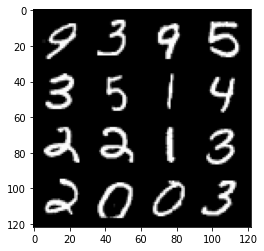

 59%|█████▉    | 279/469 [00:07<00:08, 22.02it/s]

41: step 19500 / Gen loss: 5.877568006515505 / disc_loss: 0.04115835220242538


 22%|██▏       | 102/469 [00:02<00:09, 38.23it/s]

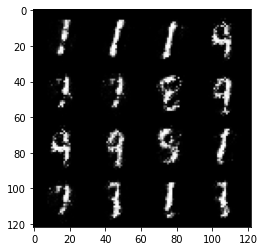

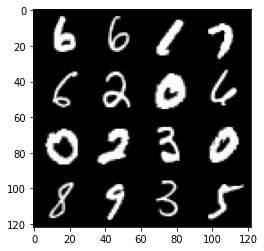

 23%|██▎       | 106/469 [00:03<00:17, 20.31it/s]

42: step 19800 / Gen loss: 5.828053587277733 / disc_loss: 0.051857731075336574


 86%|████████▌ | 401/469 [00:11<00:01, 40.67it/s]

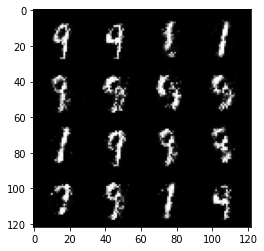

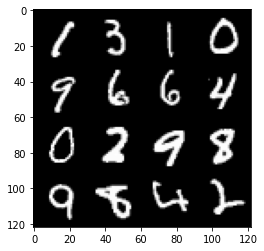

 87%|████████▋ | 406/469 [00:12<00:02, 22.84it/s]

42: step 20100 / Gen loss: 5.316521441141769 / disc_loss: 0.05351228920742866


 49%|████▉     | 232/469 [00:06<00:06, 38.34it/s]

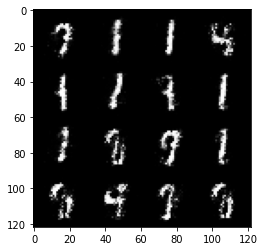

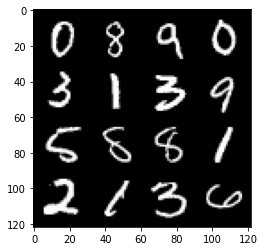

 51%|█████     | 240/469 [00:06<00:09, 23.23it/s]

43: step 20400 / Gen loss: 5.263766992886862 / disc_loss: 0.05043332441709936


 14%|█▎        | 64/469 [00:01<00:10, 37.07it/s]

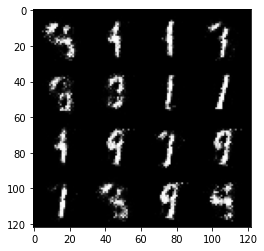

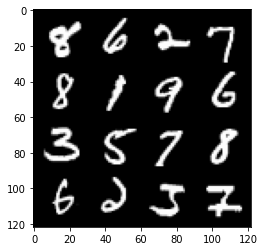

 15%|█▌        | 72/469 [00:02<00:17, 23.27it/s]

44: step 20700 / Gen loss: 5.2818183708190904 / disc_loss: 0.059020248545954654


 77%|███████▋  | 361/469 [00:09<00:02, 41.66it/s]

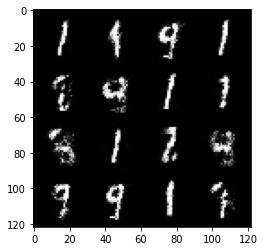

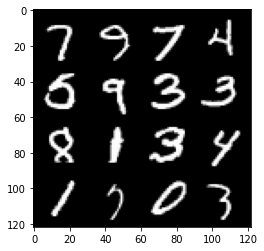

 79%|███████▉  | 370/469 [00:10<00:03, 26.47it/s]

44: step 21000 / Gen loss: 5.197155621846517 / disc_loss: 0.05611296553164724


 42%|████▏     | 195/469 [00:05<00:09, 29.22it/s]

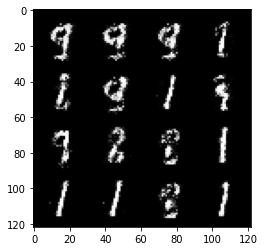

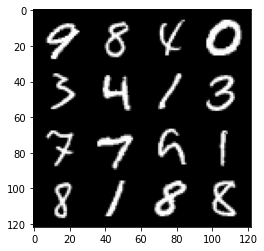

 43%|████▎     | 201/469 [00:05<00:16, 16.48it/s]

45: step 21300 / Gen loss: 4.970042833487189 / disc_loss: 0.059822667129337814


  5%|▌         | 24/469 [00:00<00:11, 38.16it/s]

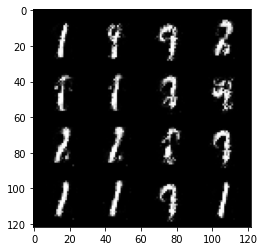

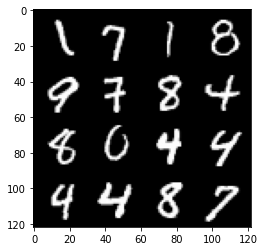

  7%|▋         | 32/469 [00:01<00:18, 24.06it/s]

46: step 21600 / Gen loss: 4.975731264750162 / disc_loss: 0.05476915913323562


 69%|██████▉   | 323/469 [00:08<00:03, 41.03it/s]

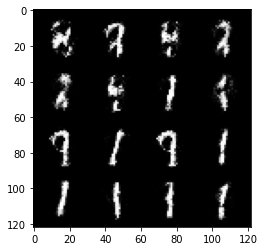

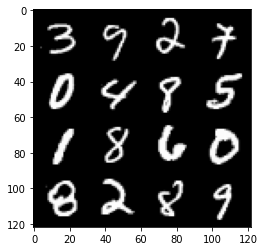

 71%|███████   | 332/469 [00:09<00:05, 23.78it/s]

46: step 21900 / Gen loss: 5.023183103402455 / disc_loss: 0.07219424448907374


 33%|███▎      | 156/469 [00:04<00:07, 41.71it/s]

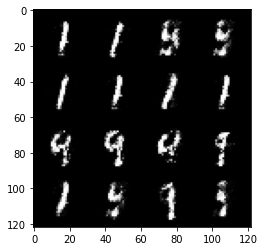

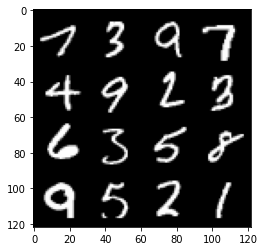

 35%|███▌      | 165/469 [00:04<00:11, 26.75it/s]

47: step 22200 / Gen loss: 4.633367469310762 / disc_loss: 0.07837002956618863


 97%|█████████▋| 455/469 [00:11<00:00, 40.39it/s]

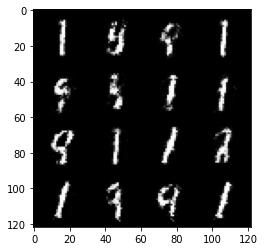

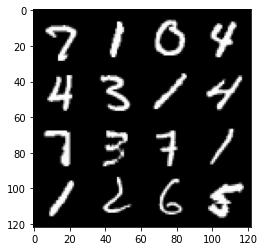

 99%|█████████▉| 464/469 [00:12<00:00, 26.16it/s]

47: step 22500 / Gen loss: 4.427180434862776 / disc_loss: 0.07447222778573633


 61%|██████    | 287/469 [00:07<00:05, 33.73it/s]

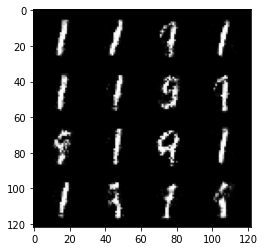

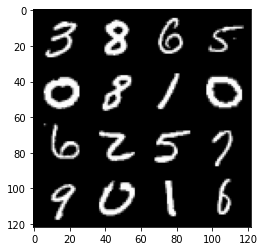

 63%|██████▎   | 294/469 [00:08<00:09, 18.15it/s]

48: step 22800 / Gen loss: 4.450716209411617 / disc_loss: 0.07240038929507135


 25%|██▌       | 119/469 [00:03<00:08, 41.32it/s]

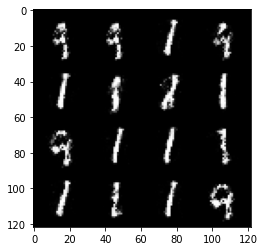

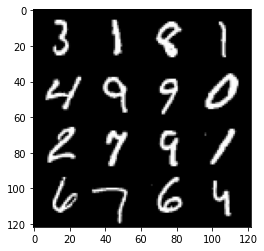

 26%|██▋       | 124/469 [00:03<00:14, 23.43it/s]

49: step 23100 / Gen loss: 4.407102902730305 / disc_loss: 0.07508855218067763


 89%|████████▊ | 416/469 [00:10<00:01, 41.69it/s]

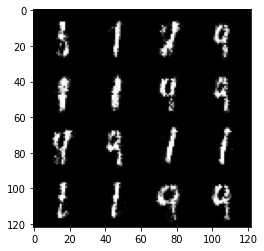

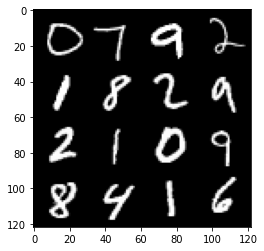

 91%|█████████ | 425/469 [00:11<00:01, 26.79it/s]

49: step 23400 / Gen loss: 4.141360147794087 / disc_loss: 0.08725349877650533


 53%|█████▎    | 248/469 [00:06<00:05, 39.55it/s]

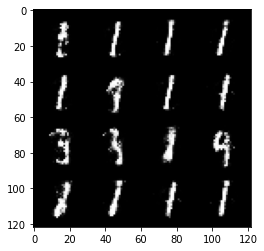

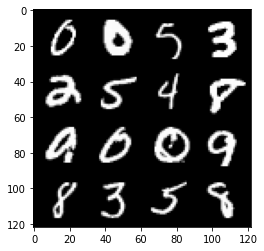

 55%|█████▍    | 256/469 [00:06<00:08, 24.97it/s]

50: step 23700 / Gen loss: 4.016786133448283 / disc_loss: 0.09536255036791168


 17%|█▋        | 81/469 [00:02<00:09, 38.99it/s]

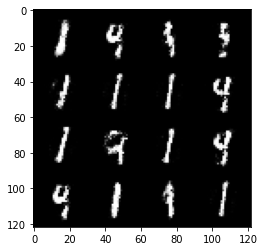

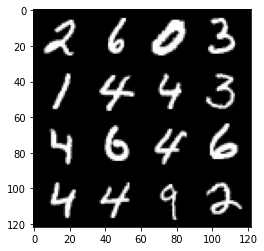

 19%|█▉        | 89/469 [00:02<00:15, 23.86it/s]

51: step 24000 / Gen loss: 3.8136304958661396 / disc_loss: 0.09989230570693804


 81%|████████  | 380/469 [00:09<00:02, 40.68it/s]

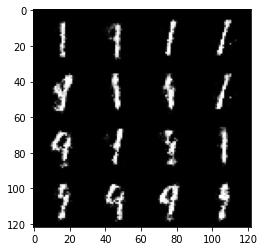

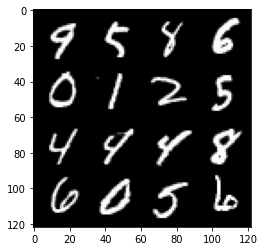

 82%|████████▏ | 385/469 [00:10<00:04, 20.61it/s]

51: step 24300 / Gen loss: 3.6853180670738213 / disc_loss: 0.10360416485617556


 45%|████▍     | 211/469 [00:05<00:06, 38.11it/s]

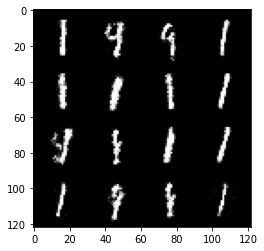

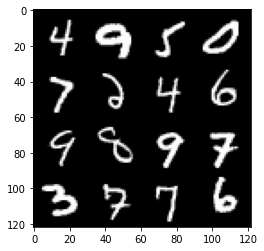

 47%|████▋     | 219/469 [00:06<00:11, 21.44it/s]

52: step 24600 / Gen loss: 3.7139911405245454 / disc_loss: 0.10815856009721755


  9%|▊         | 41/469 [00:01<00:10, 39.28it/s]

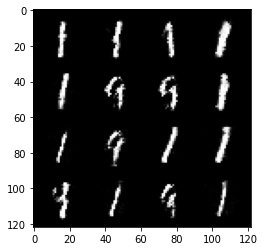

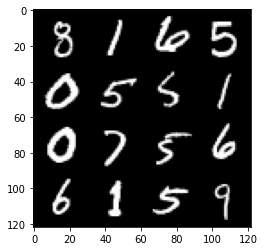

 10%|█         | 49/469 [00:01<00:17, 24.69it/s]

53: step 24900 / Gen loss: 3.632077507972718 / disc_loss: 0.11470787857348716


 73%|███████▎  | 342/469 [00:08<00:03, 41.39it/s]

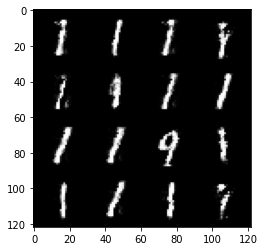

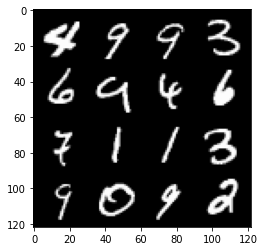

 75%|███████▍  | 351/469 [00:09<00:04, 26.41it/s]

53: step 25200 / Gen loss: 3.5021255675951655 / disc_loss: 0.11448102338860436


 37%|███▋      | 173/469 [00:05<00:10, 28.49it/s]

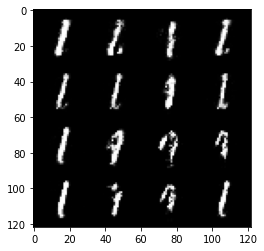

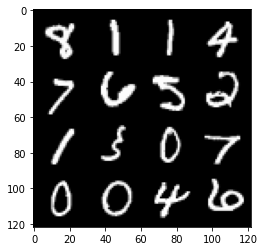

 38%|███▊      | 179/469 [00:05<00:19, 14.99it/s]

54: step 25500 / Gen loss: 3.4358781758944197 / disc_loss: 0.12360907660176355


  1%|          | 4/469 [00:00<00:14, 32.70it/s]

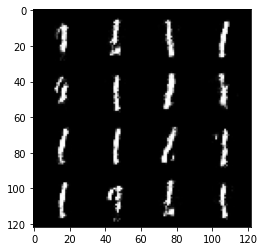

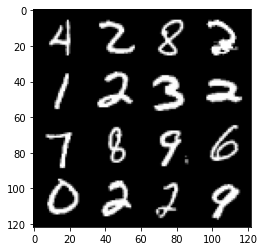

  3%|▎         | 12/469 [00:00<00:27, 16.85it/s]

55: step 25800 / Gen loss: 3.44906352519989 / disc_loss: 0.113386209482948


 64%|██████▍   | 302/469 [00:08<00:04, 37.05it/s]

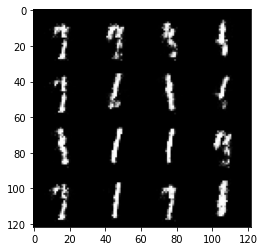

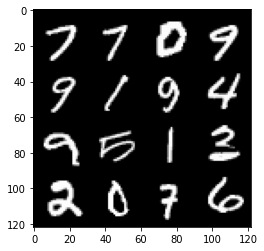

 66%|██████▌   | 310/469 [00:09<00:06, 22.97it/s]

55: step 26100 / Gen loss: 3.43376124382019 / disc_loss: 0.12865465107063453


 29%|██▉       | 136/469 [00:03<00:07, 42.23it/s]

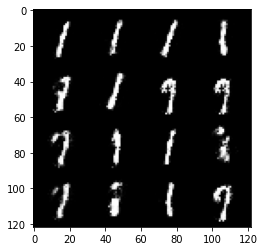

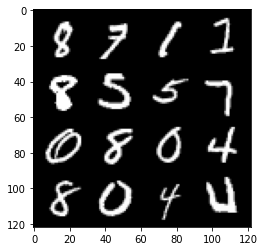

 30%|███       | 141/469 [00:03<00:13, 23.77it/s]

56: step 26400 / Gen loss: 3.2949588243166597 / disc_loss: 0.13428009963283946


 93%|█████████▎| 436/469 [00:11<00:00, 34.36it/s]

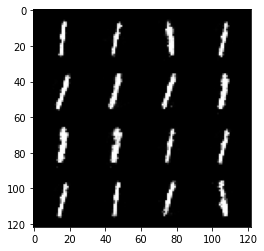

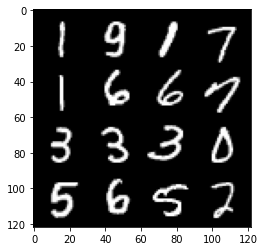

 94%|█████████▍| 440/469 [00:12<00:01, 18.22it/s]

56: step 26700 / Gen loss: 3.240072587331137 / disc_loss: 0.13403567273169756


 57%|█████▋    | 267/469 [00:07<00:05, 37.72it/s]

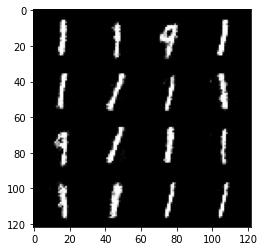

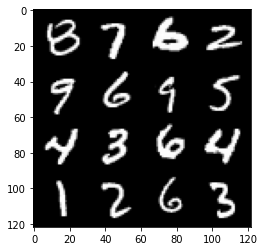

 59%|█████▊    | 275/469 [00:07<00:08, 23.28it/s]

57: step 27000 / Gen loss: 3.103510773976642 / disc_loss: 0.14076920760174588


 20%|██        | 96/469 [00:02<00:10, 36.01it/s]

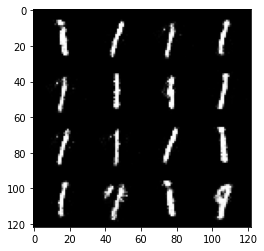

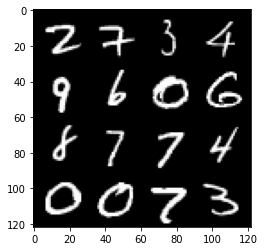

 22%|██▏       | 104/469 [00:03<00:19, 18.42it/s]

58: step 27300 / Gen loss: 3.112021124362948 / disc_loss: 0.1368119519452254


 85%|████████▍ | 398/469 [00:11<00:02, 33.88it/s]

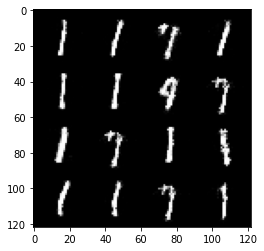

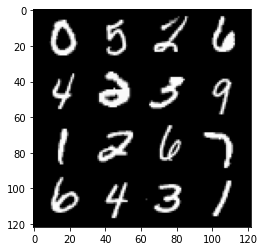

 86%|████████▌ | 402/469 [00:12<00:03, 17.10it/s]

58: step 27600 / Gen loss: 3.058608005046846 / disc_loss: 0.15093331327040996


 49%|████▉     | 229/469 [00:06<00:06, 36.66it/s]

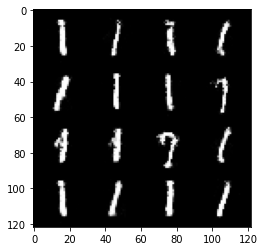

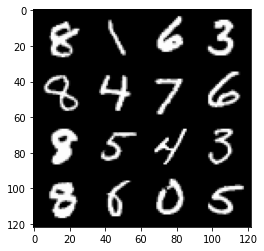

 50%|████▉     | 233/469 [00:07<00:12, 18.55it/s]

59: step 27900 / Gen loss: 3.0036997882525114 / disc_loss: 0.14244114336868113


 13%|█▎        | 60/469 [00:01<00:11, 36.27it/s]

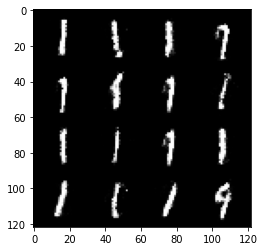

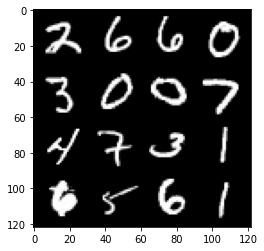

 14%|█▍        | 68/469 [00:02<00:17, 22.58it/s]

60: step 28200 / Gen loss: 2.9036064783732116 / disc_loss: 0.15478493583699068


 77%|███████▋  | 359/469 [00:09<00:02, 37.66it/s]

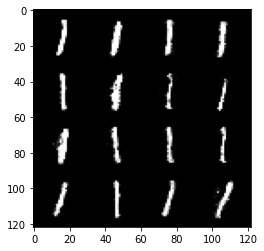

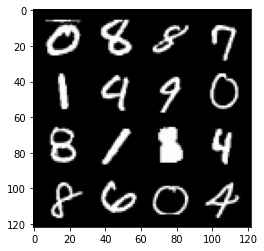

 78%|███████▊  | 367/469 [00:10<00:04, 24.09it/s]

60: step 28500 / Gen loss: 2.8666857997576387 / disc_loss: 0.15980783658723038


 41%|████      | 191/469 [00:05<00:07, 38.07it/s]

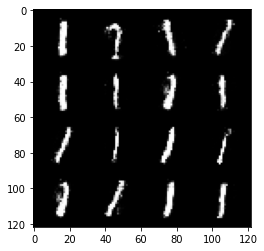

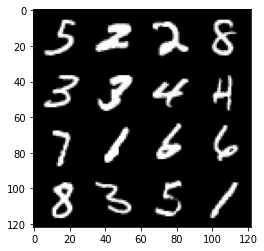

 42%|████▏     | 199/469 [00:06<00:11, 22.71it/s]

61: step 28800 / Gen loss: 2.8450009091695163 / disc_loss: 0.16369448721408844


  5%|▍         | 22/469 [00:00<00:11, 40.39it/s]

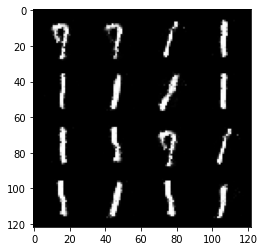

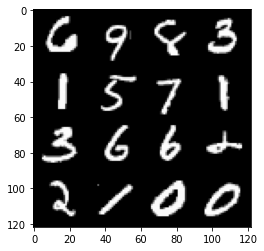

  6%|▌         | 27/469 [00:01<00:22, 20.01it/s]

62: step 29100 / Gen loss: 2.783308475812278 / disc_loss: 0.16063962365190196


 68%|██████▊   | 320/469 [00:08<00:03, 37.99it/s]

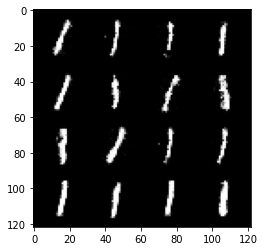

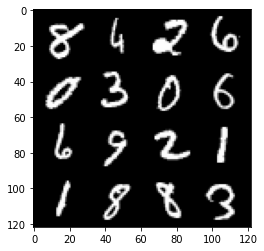

 70%|██████▉   | 328/469 [00:09<00:06, 23.14it/s]

62: step 29400 / Gen loss: 2.7508582735061657 / disc_loss: 0.15888123556971553


 33%|███▎      | 153/469 [00:04<00:08, 38.51it/s]

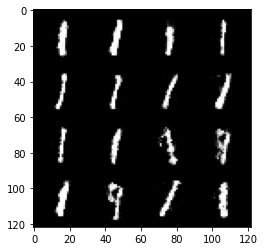

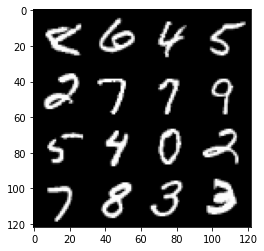

 34%|███▍      | 161/469 [00:04<00:13, 23.57it/s]

63: step 29700 / Gen loss: 2.7253899860382087 / disc_loss: 0.16753103611369927


 96%|█████████▌| 450/469 [00:12<00:00, 37.18it/s]

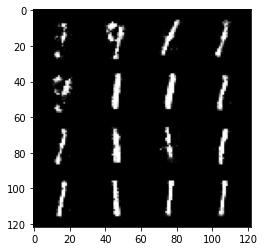

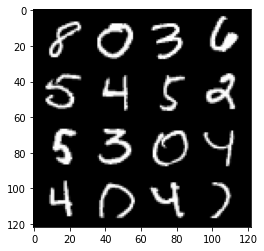

 98%|█████████▊| 458/469 [00:12<00:00, 21.47it/s]

63: step 30000 / Gen loss: 2.6760197822252914 / disc_loss: 0.17026852558056513


 60%|█████▉    | 281/469 [00:07<00:05, 36.81it/s]

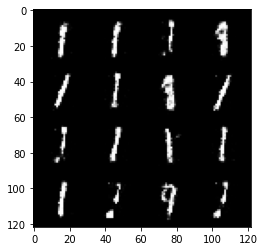

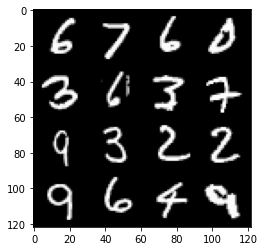

 62%|██████▏   | 289/469 [00:08<00:08, 20.92it/s]

64: step 30300 / Gen loss: 2.646455876032512 / disc_loss: 0.17115726354221497


 24%|██▍       | 112/469 [00:03<00:10, 35.24it/s]

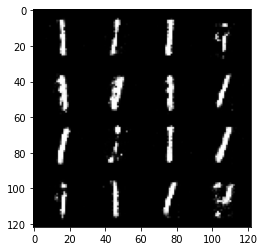

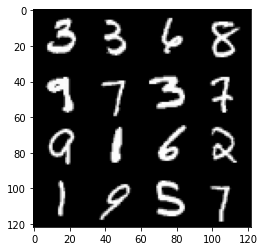

 26%|██▌       | 120/469 [00:03<00:15, 21.89it/s]

65: step 30600 / Gen loss: 2.7463829366366066 / disc_loss: 0.15904970613618696


 88%|████████▊ | 413/469 [00:11<00:01, 35.73it/s]

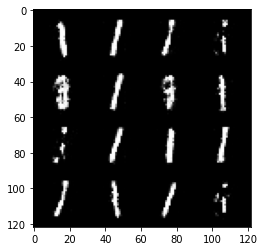

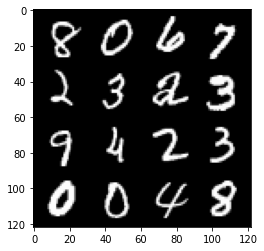

 90%|████████▉ | 421/469 [00:12<00:02, 21.02it/s]

65: step 30900 / Gen loss: 2.7180341545740747 / disc_loss: 0.1561050267517567


 52%|█████▏    | 245/469 [00:06<00:05, 38.30it/s]

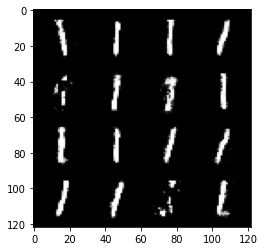

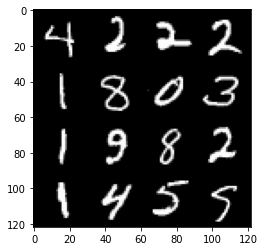

 54%|█████▍    | 253/469 [00:07<00:09, 22.54it/s]

66: step 31200 / Gen loss: 2.811984604994458 / disc_loss: 0.16174448219438387


 16%|█▌        | 76/469 [00:02<00:11, 33.26it/s]

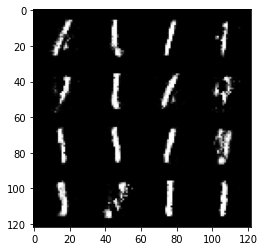

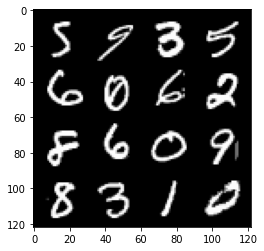

 17%|█▋        | 80/469 [00:02<00:25, 15.29it/s]

67: step 31500 / Gen loss: 2.814511919816336 / disc_loss: 0.16795930524667102


 80%|███████▉  | 374/469 [00:10<00:02, 38.70it/s]

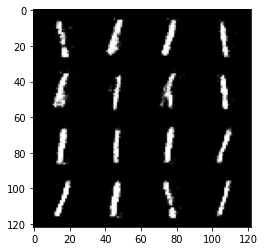

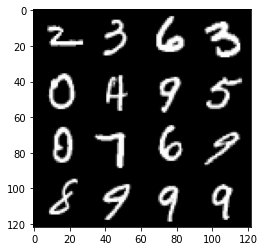

 81%|████████▏ | 382/469 [00:11<00:03, 22.37it/s]

67: step 31800 / Gen loss: 2.7052850866317746 / disc_loss: 0.17074583115677058


 44%|████▍     | 208/469 [00:05<00:06, 37.92it/s]

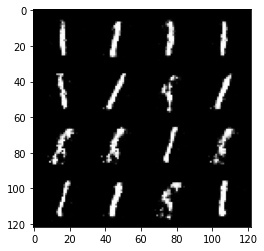

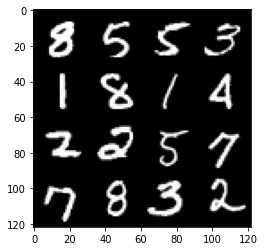

 46%|████▌     | 216/469 [00:06<00:11, 22.49it/s]

68: step 32100 / Gen loss: 2.7045394651095074 / disc_loss: 0.16423021602133914


  8%|▊         | 36/469 [00:00<00:11, 37.19it/s]

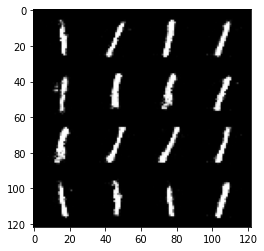

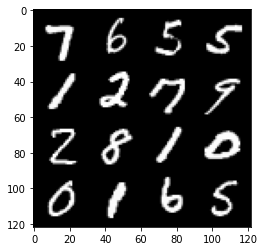

  9%|▉         | 44/469 [00:01<00:19, 21.99it/s]

69: step 32400 / Gen loss: 2.7739022231102 / disc_loss: 0.15411304220557212


 72%|███████▏  | 336/469 [00:09<00:03, 38.24it/s]

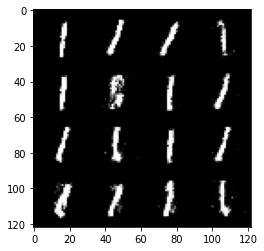

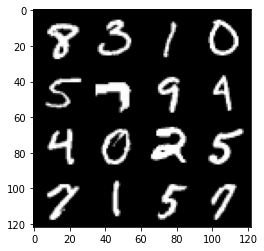

 73%|███████▎  | 344/469 [00:09<00:06, 19.36it/s]

69: step 32700 / Gen loss: 2.716313784122465 / disc_loss: 0.17135607962807017


 36%|███▌      | 169/469 [00:04<00:10, 28.83it/s]

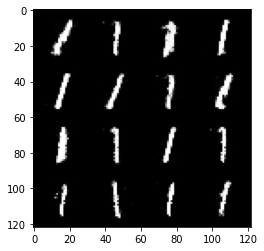

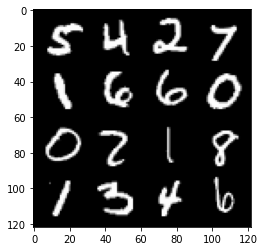

 38%|███▊      | 176/469 [00:05<00:17, 16.53it/s]

70: step 33000 / Gen loss: 2.6420371238390614 / disc_loss: 0.1686672365913788


  0%|          | 0/469 [00:00<?, ?it/s]

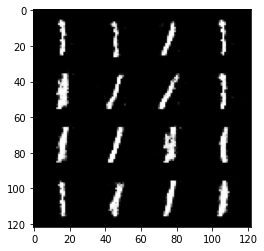

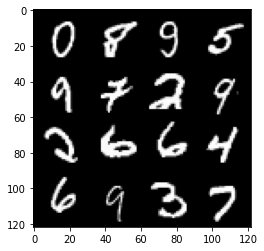

  1%|▏         | 6/469 [00:00<00:31, 14.59it/s]

71: step 33300 / Gen loss: 2.7167712942759183 / disc_loss: 0.15558765339354666


 64%|██████▍   | 299/469 [00:08<00:04, 38.25it/s]

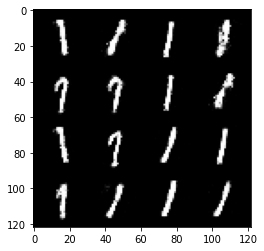

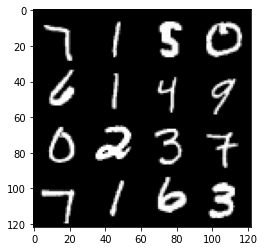

 65%|██████▌   | 307/469 [00:08<00:07, 23.06it/s]

71: step 33600 / Gen loss: 2.759735770225525 / disc_loss: 0.16332454204559319


 28%|██▊       | 132/469 [00:03<00:08, 38.18it/s]

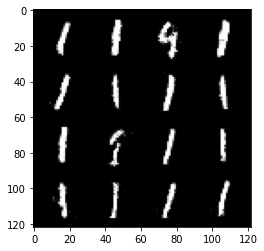

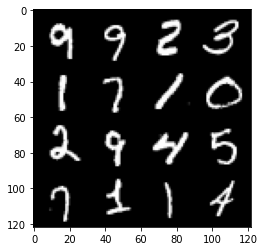

 30%|██▉       | 140/469 [00:04<00:14, 22.46it/s]

72: step 33900 / Gen loss: 2.638631010850271 / disc_loss: 0.1712269614388546


 91%|█████████▏| 429/469 [00:11<00:01, 37.72it/s]

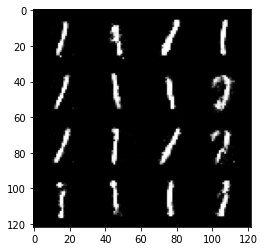

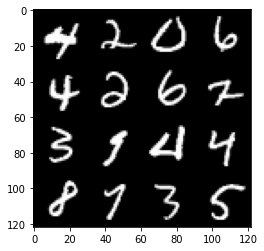

 93%|█████████▎| 437/469 [00:12<00:01, 22.78it/s]

72: step 34200 / Gen loss: 2.6213267676035565 / disc_loss: 0.17247892449299485


 56%|█████▌    | 261/469 [00:07<00:05, 38.17it/s]

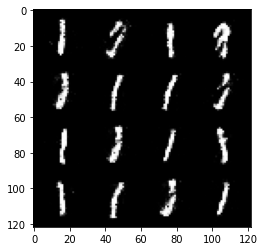

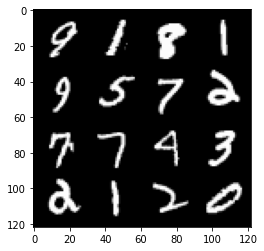

 57%|█████▋    | 269/469 [00:08<00:09, 21.92it/s]

73: step 34500 / Gen loss: 2.577256842454273 / disc_loss: 0.16982847367723783


 20%|██        | 94/469 [00:02<00:09, 37.93it/s]

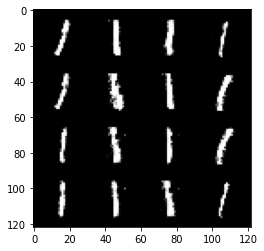

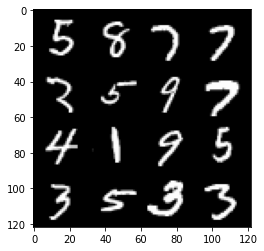

 22%|██▏       | 102/469 [00:02<00:16, 22.36it/s]

74: step 34800 / Gen loss: 2.660884395440418 / disc_loss: 0.1678005792448919


 83%|████████▎ | 391/469 [00:10<00:02, 38.05it/s]

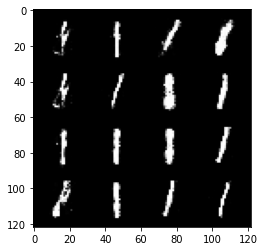

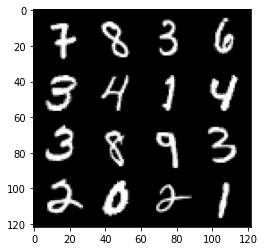

 85%|████████▌ | 399/469 [00:11<00:03, 22.89it/s]

74: step 35100 / Gen loss: 2.610436686674755 / disc_loss: 0.17810029188791918


 48%|████▊     | 225/469 [00:05<00:06, 36.99it/s]

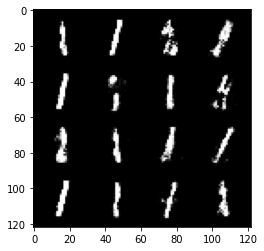

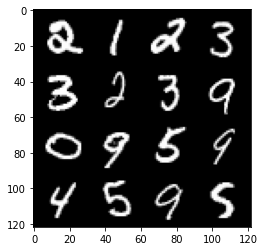

 49%|████▉     | 229/469 [00:06<00:14, 16.58it/s]

75: step 35400 / Gen loss: 2.530188713073729 / disc_loss: 0.1753985290477674


 12%|█▏        | 56/469 [00:01<00:10, 38.42it/s]

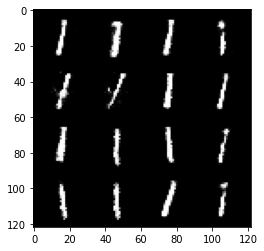

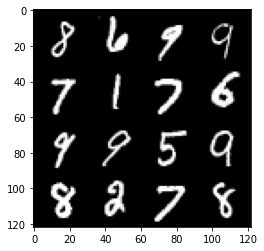

 14%|█▎        | 64/469 [00:02<00:17, 22.53it/s]

76: step 35700 / Gen loss: 2.501523226896923 / disc_loss: 0.17622070950766408


 75%|███████▌  | 354/469 [00:10<00:02, 39.01it/s]

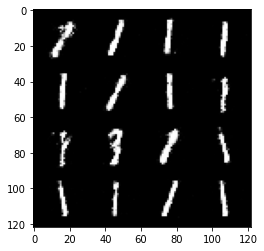

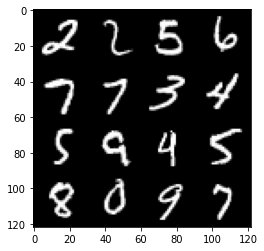

 77%|███████▋  | 362/469 [00:10<00:04, 23.44it/s]

76: step 36000 / Gen loss: 2.499996392726897 / disc_loss: 0.17955893538892265


 40%|███▉      | 186/469 [00:04<00:07, 38.17it/s]

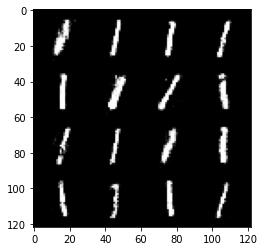

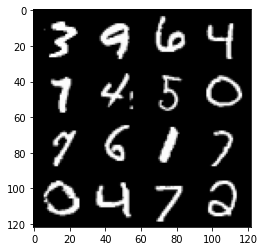

 41%|████▏     | 194/469 [00:05<00:11, 23.20it/s]

77: step 36300 / Gen loss: 2.5265789214770016 / disc_loss: 0.18060626794894535


  3%|▎         | 16/469 [00:00<00:12, 36.96it/s]

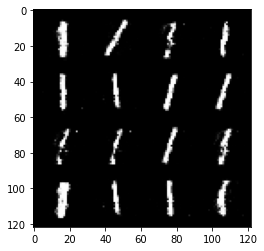

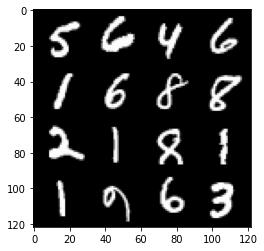

  5%|▌         | 24/469 [00:00<00:20, 21.43it/s]

78: step 36600 / Gen loss: 2.490750745137532 / disc_loss: 0.1859550044188896


 68%|██████▊   | 318/469 [00:08<00:04, 37.61it/s]

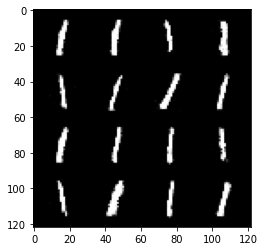

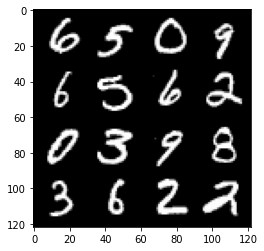

 70%|██████▉   | 326/469 [00:09<00:06, 23.04it/s]

78: step 36900 / Gen loss: 2.45475519657135 / disc_loss: 0.18400200963020324


 32%|███▏      | 148/469 [00:03<00:08, 38.63it/s]

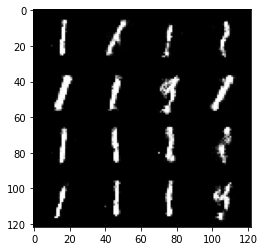

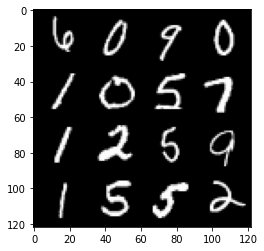

 33%|███▎      | 156/469 [00:04<00:14, 21.96it/s]

79: step 37200 / Gen loss: 2.456117600599924 / disc_loss: 0.18970939531922343


 95%|█████████▍| 445/469 [00:12<00:00, 37.89it/s]

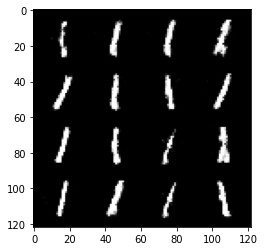

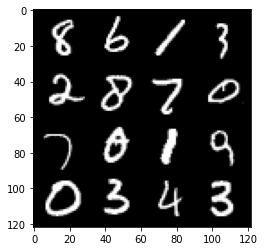

 97%|█████████▋| 454/469 [00:12<00:00, 23.76it/s]

79: step 37500 / Gen loss: 2.4175495139757825 / disc_loss: 0.18815173303087543


 59%|█████▉    | 278/469 [00:07<00:05, 38.20it/s]

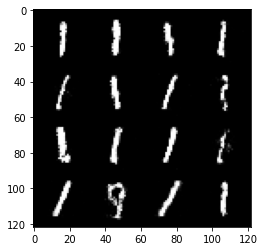

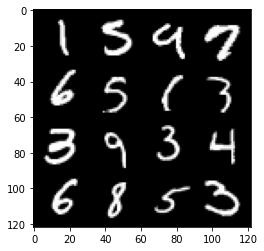

 61%|██████    | 286/469 [00:07<00:08, 22.85it/s]

80: step 37800 / Gen loss: 2.4444816780090335 / disc_loss: 0.18810665147999936


 23%|██▎       | 108/469 [00:02<00:09, 38.65it/s]

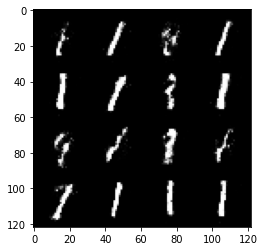

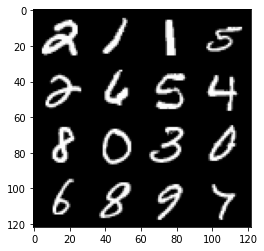

 25%|██▍       | 116/469 [00:03<00:16, 21.56it/s]

81: step 38100 / Gen loss: 2.39139555454254 / disc_loss: 0.20125296868383893


 87%|████████▋ | 410/469 [00:10<00:01, 38.07it/s]

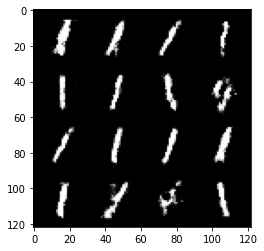

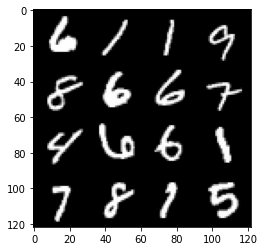

 89%|████████▉ | 418/469 [00:11<00:02, 22.78it/s]

81: step 38400 / Gen loss: 2.362171224753062 / disc_loss: 0.19380833161373923


 52%|█████▏    | 242/469 [00:06<00:05, 37.94it/s]

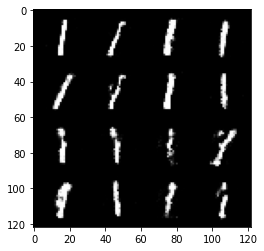

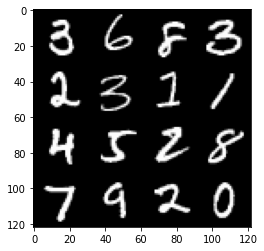

 52%|█████▏    | 246/469 [00:06<00:12, 18.17it/s]

82: step 38700 / Gen loss: 2.4291777149836222 / disc_loss: 0.18472465448081485


 15%|█▌        | 72/469 [00:01<00:10, 38.45it/s]

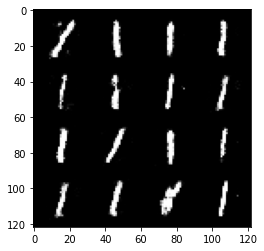

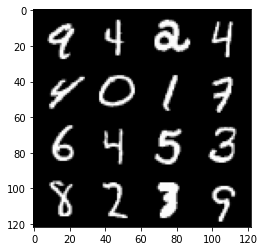

 17%|█▋        | 79/469 [00:02<00:19, 20.50it/s]

83: step 39000 / Gen loss: 2.3957135955492643 / disc_loss: 0.1921638245880604


 79%|███████▉  | 371/469 [00:11<00:02, 37.66it/s]

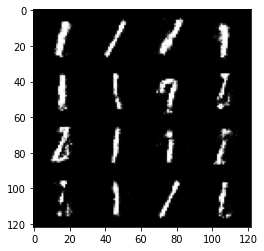

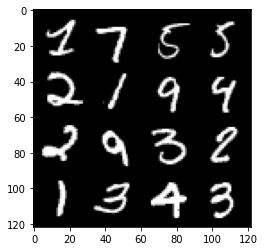

 81%|████████  | 379/469 [00:11<00:03, 23.05it/s]

83: step 39300 / Gen loss: 2.4333161322275783 / disc_loss: 0.189523407916228


 43%|████▎     | 203/469 [00:05<00:06, 38.53it/s]

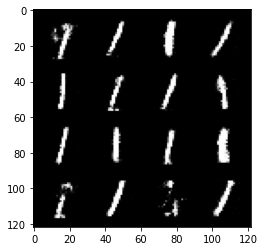

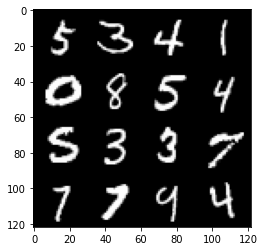

 45%|████▍     | 211/469 [00:05<00:12, 21.27it/s]

84: step 39600 / Gen loss: 2.339812165896099 / disc_loss: 0.19910146817564986


  7%|▋         | 32/469 [00:00<00:11, 38.23it/s]

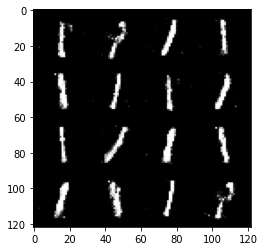

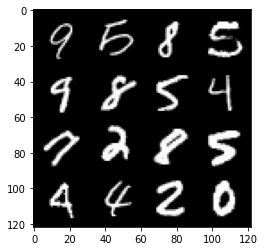

  9%|▊         | 40/469 [00:01<00:19, 22.51it/s]

85: step 39900 / Gen loss: 2.3359871538480133 / disc_loss: 0.20481052180131265


 71%|███████   | 332/469 [00:09<00:04, 31.26it/s]

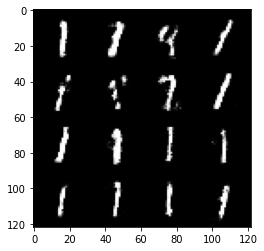

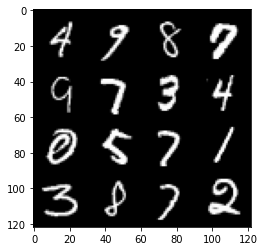

 72%|███████▏  | 340/469 [00:10<00:06, 19.86it/s]

85: step 40200 / Gen loss: 2.2995222345987965 / disc_loss: 0.198214320813616


 35%|███▍      | 163/469 [00:04<00:08, 37.96it/s]

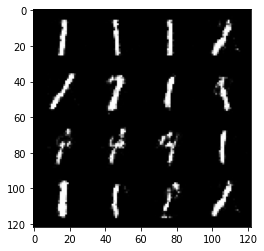

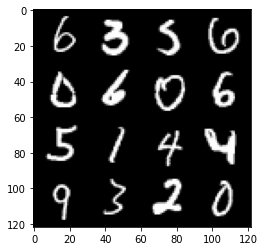

 36%|███▋      | 171/469 [00:04<00:12, 23.33it/s]

86: step 40500 / Gen loss: 2.3990780758857744 / disc_loss: 0.19680101633071895


 99%|█████████▉| 466/469 [00:12<00:00, 37.97it/s]

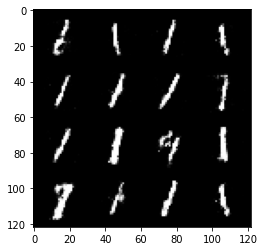

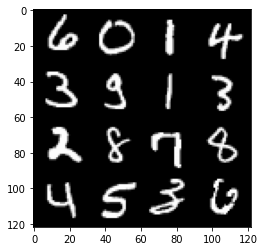

100%|██████████| 469/469 [00:13<00:00, 35.68it/s]


86: step 40800 / Gen loss: 2.3261414003372187 / disc_loss: 0.19957927840451417


 63%|██████▎   | 295/469 [00:07<00:04, 36.08it/s]

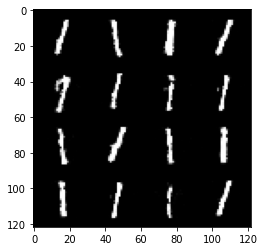

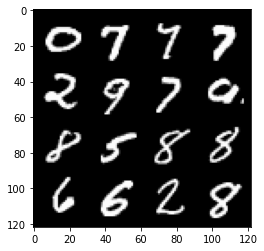

 65%|██████▍   | 303/469 [00:08<00:07, 21.83it/s]

87: step 41100 / Gen loss: 2.3477786652247103 / disc_loss: 0.18899780141810568


 27%|██▋       | 125/469 [00:03<00:09, 36.86it/s]

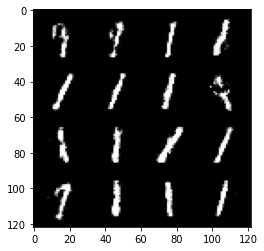

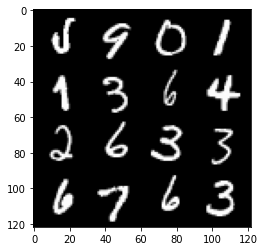

 28%|██▊       | 133/469 [00:03<00:15, 21.93it/s]

88: step 41400 / Gen loss: 2.347336853345236 / disc_loss: 0.20085717613498363


 91%|█████████ | 425/469 [00:12<00:01, 37.08it/s]

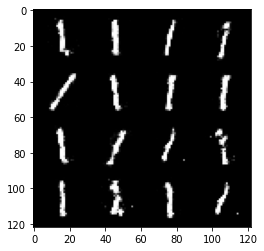

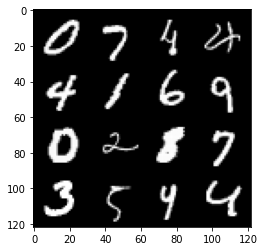

 92%|█████████▏| 433/469 [00:13<00:01, 21.76it/s]

88: step 41700 / Gen loss: 2.3090488847096746 / disc_loss: 0.20441985428333284


 55%|█████▍    | 256/469 [00:06<00:05, 36.89it/s]

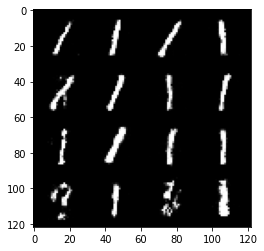

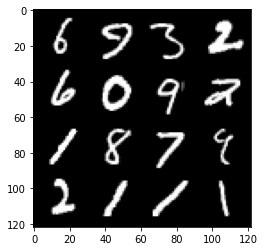

 56%|█████▋    | 264/469 [00:07<00:09, 22.77it/s]

89: step 42000 / Gen loss: 2.3475595935185725 / disc_loss: 0.20242845607300594


 19%|█▉        | 89/469 [00:02<00:09, 38.12it/s]

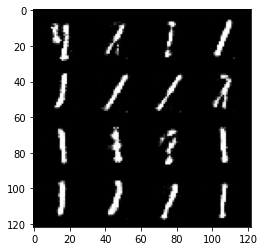

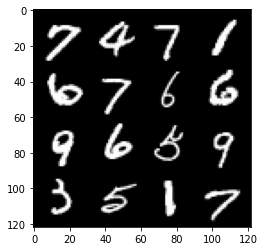

 21%|██        | 97/469 [00:02<00:16, 22.49it/s]

90: step 42300 / Gen loss: 2.2953162995974212 / disc_loss: 0.2065581061442692


 83%|████████▎ | 389/469 [00:10<00:02, 37.30it/s]

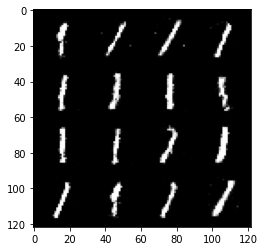

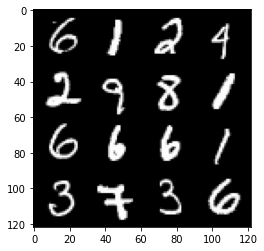

 85%|████████▍ | 397/469 [00:11<00:03, 22.61it/s]

90: step 42600 / Gen loss: 2.3429768220583607 / disc_loss: 0.19842404648661605


 47%|████▋     | 220/469 [00:05<00:06, 36.80it/s]

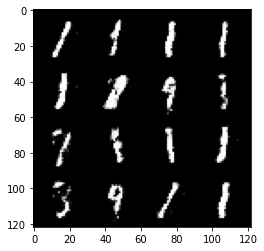

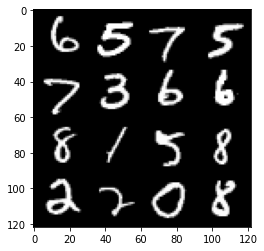

 49%|████▊     | 228/469 [00:06<00:10, 22.25it/s]

91: step 42900 / Gen loss: 2.335812986691794 / disc_loss: 0.2043533038844665


 11%|█         | 52/469 [00:01<00:11, 37.22it/s]

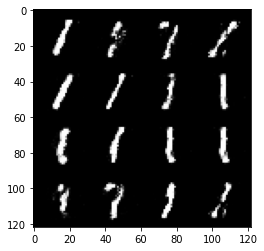

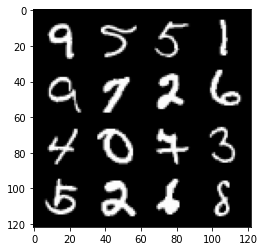

 13%|█▎        | 60/469 [00:01<00:18, 22.65it/s]

92: step 43200 / Gen loss: 2.327381720542909 / disc_loss: 0.2063186023632684


 75%|███████▌  | 352/469 [00:09<00:03, 37.47it/s]

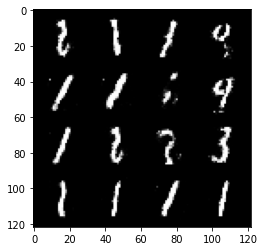

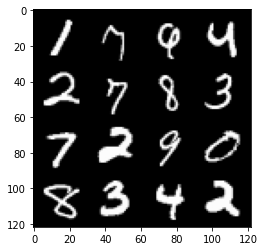

 77%|███████▋  | 360/469 [00:10<00:05, 20.29it/s]

92: step 43500 / Gen loss: 2.311311054229737 / disc_loss: 0.20637988197306797


 38%|███▊      | 180/469 [00:04<00:07, 38.73it/s]

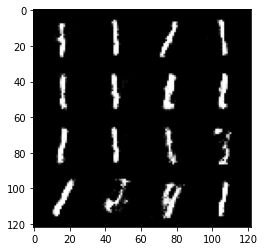

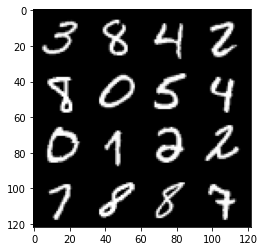

 40%|████      | 188/469 [00:05<00:12, 22.99it/s]

93: step 43800 / Gen loss: 2.279649811585743 / disc_loss: 0.22009258434176426


  3%|▎         | 12/469 [00:00<00:12, 37.92it/s]

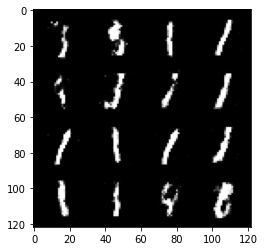

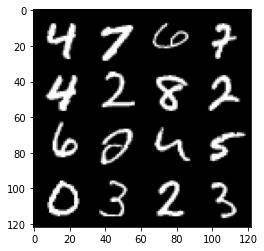

  4%|▍         | 20/469 [00:00<00:21, 21.09it/s]

94: step 44100 / Gen loss: 2.226168764432272 / disc_loss: 0.2240240486959616


 67%|██████▋   | 314/469 [00:08<00:04, 37.87it/s]

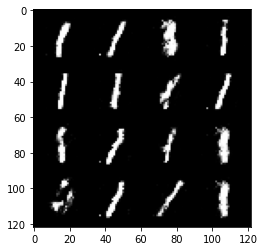

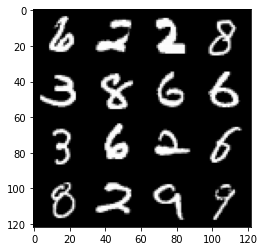

 69%|██████▊   | 322/469 [00:09<00:06, 22.37it/s]

94: step 44400 / Gen loss: 2.2761202975114188 / disc_loss: 0.22222059041261671


 31%|███       | 145/469 [00:03<00:08, 36.11it/s]

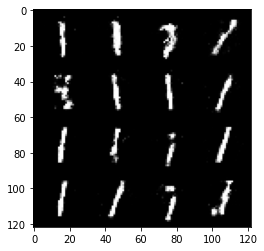

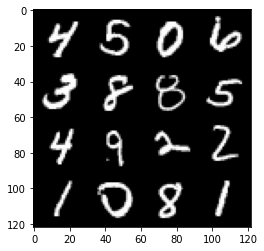

 33%|███▎      | 153/469 [00:04<00:14, 22.15it/s]

95: step 44700 / Gen loss: 2.236197271347046 / disc_loss: 0.2199607285360495


 95%|█████████▍| 445/469 [00:12<00:00, 35.57it/s]

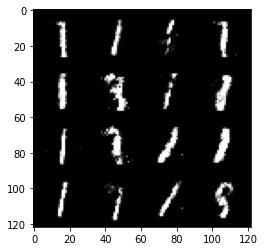

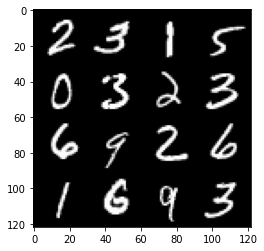

 97%|█████████▋| 453/469 [00:12<00:00, 20.12it/s]

95: step 45000 / Gen loss: 2.252666705449421 / disc_loss: 0.21494800508022296


 59%|█████▊    | 275/469 [00:07<00:05, 38.06it/s]

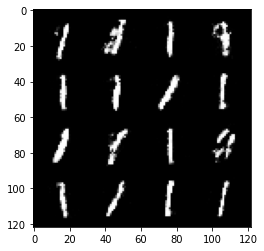

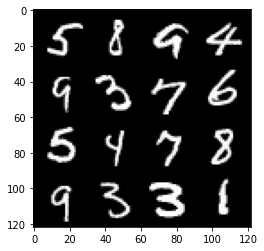

 60%|██████    | 283/469 [00:07<00:08, 22.61it/s]

96: step 45300 / Gen loss: 2.216493170261383 / disc_loss: 0.2168368256837128


 22%|██▏       | 104/469 [00:02<00:09, 38.14it/s]

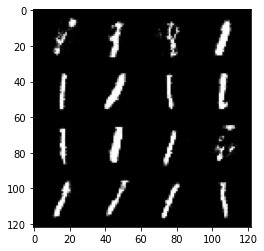

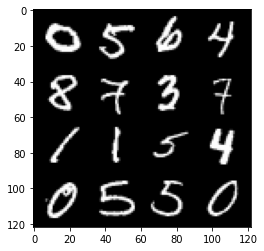

 24%|██▍       | 112/469 [00:03<00:15, 22.66it/s]

97: step 45600 / Gen loss: 2.2007467246055605 / disc_loss: 0.22110230276981988


 87%|████████▋ | 406/469 [00:11<00:01, 38.58it/s]

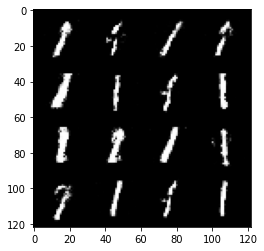

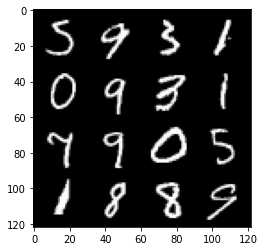

 88%|████████▊ | 414/469 [00:11<00:02, 22.44it/s]

97: step 45900 / Gen loss: 2.1891625642776478 / disc_loss: 0.21815932204325997


 50%|█████     | 236/469 [00:06<00:06, 38.31it/s]

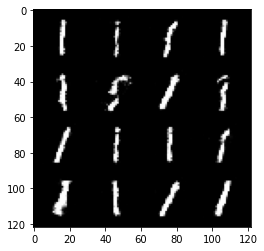

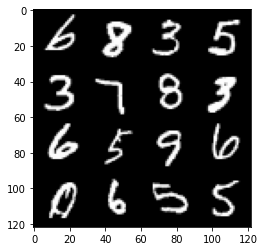

 52%|█████▏    | 244/469 [00:06<00:11, 20.35it/s]

98: step 46200 / Gen loss: 2.176691973209382 / disc_loss: 0.22815498953064292


 14%|█▍        | 68/469 [00:01<00:10, 37.70it/s]

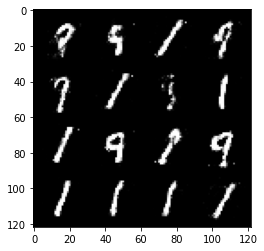

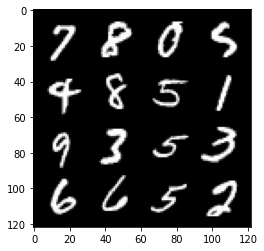

 16%|█▌        | 76/469 [00:02<00:17, 22.35it/s]

99: step 46500 / Gen loss: 2.160940556128819 / disc_loss: 0.22754678577184678


 78%|███████▊  | 368/469 [00:10<00:02, 38.01it/s]

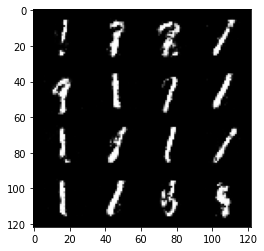

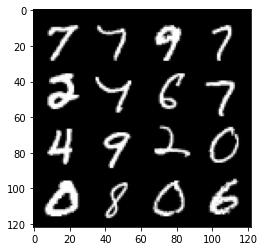

 80%|████████  | 376/469 [00:10<00:04, 22.24it/s]

99: step 46800 / Gen loss: 2.205821401278177 / disc_loss: 0.22554262548685058


100%|██████████| 469/469 [00:13<00:00, 35.64it/s]


In [8]:
for epoch in range(epochs):
  for real, _ in tqdm(dataloader):

    ## Discriminator
    disc_opt.zero_grad()

    cur_bs= len(real)
    real =real.view(cur_bs, -1)
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)

    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ## Generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    ## Visualization & stats

    mean_disc_loss += disc_loss.item()/info_step
    mean_gen_loss += gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss = 0, 0
    cur_step += 1